<h1>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;📺 Movie Recommendation System 😎🍿</h1>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;<img src="https://drive.google.com/uc?export=view&id=1CPGew-W5ubY7q2IesyWF6Adz3F6EFfzE" alt="Movie Recommendation System" style="width:100%;"/>




**Project Description**

* The Movie Recommendation System project focuses on developing a personalized movie recommendation engine that suggests movies to users based on their preferences and viewing history. By analyzing user ratings, demographics, and movie genres, the system employs advanced machine learning algorithms and collaborative filtering techniques to predict and recommend movies that users are likely to enjoy. The goal of the project is to enhance the user experience by providing tailored movie suggestions, making it easier for users to discover new films that align with their tastes.



# Team Details

**Team Name - Team Black**
<br>
<br>
**Team Members**


1. Yash Yadav (142201024)
2. Purusharth Singh Chauhan (142201016)
3. Devansh Manoj Kesan (142201017)




# Importing libraries

In [ ]:
import pandas as pd
import gdown
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# Increase the quality and resolution of our charts so we can copy/paste or just
# directly save from here.
# See:
# https://ipython.org/ipython-doc/3/api/generated/IPython.display.html
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')

# You can also just do this in Colab/Jupyter, some "magic":
# %config InlineBackend.figure_format='retina'

<ipython-input-2-919d7413d2c3>:6: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('retina')


In [ ]:
# Set default preferences for titles and labels
plt.rcParams['axes.titlesize'] = 20        # Default title font size
plt.rcParams['axes.titleweight'] = 'bold'  # Default title weight
plt.rcParams['axes.labelsize'] = 16         # Default label font size
plt.rcParams['xtick.labelsize'] = 14        # Default x-tick label size
plt.rcParams['ytick.labelsize'] = 14        # Default y-tick label size
plt.rcParams['axes.labelcolor'] = '#333333' # Default label color
plt.rcParams['axes.titlecolor'] = '#333333' # Default title color
plt.rcParams['grid.color'] = '#EEEEEE'      # Default grid color
plt.rcParams['grid.linestyle'] = '--'       # Default grid line style
plt.rcParams['grid.alpha'] = 0.7             # Default grid transparency

# Set default spine visibility and color
plt.rcParams['axes.spines.top'] = False      # Hide the top spine by default
plt.rcParams['axes.spines.right'] = False    # Hide the right spine by default
plt.rcParams['axes.spines.left'] = False     # Hide the left spine by default


# Set default ticks visibility
plt.rcParams['xtick.direction'] = 'in'       # Default x-tick direction
plt.rcParams['ytick.direction'] = 'in'       # Default y-tick direction
plt.rcParams['xtick.major.size'] = 5         # Default x-tick major size
plt.rcParams['ytick.major.size'] = 5         # Default y-tick major size

# Set the y-axis gridlines to be below the bars
plt.rcParams['axes.grid'] = True              # Enable gridlines


# plt.rcParams['grid.axis'] = 'y'               # Default gridlines on the y-axis only
# plt.rcParams['axes.spines.bottom'] = '#DDDDDD' # Set bottom spine color

# Loading The Dataset

**1. Movies Dataset (Main dataset)**

In [ ]:
# Step 1: Download the file

# File ID from the Google Drive link
file_id = '1PmLpKjqXUXe0sgKrB1HU9Wgx2aVNW-C7'
url = f'https://drive.google.com/uc?id={file_id}'
output = 'movies.csv'

# Check if the file already exists
if not os.path.exists(output):
    # Download the file if it doesn't exist
    gdown.download(url, output, quiet=False)
else:
    print(f"File '{output}' already exists. Skipping download.")



Downloading...
From: https://drive.google.com/uc?id=1PmLpKjqXUXe0sgKrB1HU9Wgx2aVNW-C7
To: /content/movies.csv
100%|██████████| 83.4M/83.4M [00:00<00:00, 87.3MB/s]


In [ ]:
# Step 2: Read the downloaded CSV file
df = pd.read_csv(output)

In [ ]:
# Dataset View
df

,Unnamed: 0,MovieID,Title,Genres,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code
0,0,1,Toy Story (1995),Animation|Children's|Comedy,1,5,978824268,F,1,10,48067
1,1,1,Toy Story (1995),Animation|Children's|Comedy,6,4,978237008,F,50,9,55117
2,2,1,Toy Story (1995),Animation|Children's|Comedy,8,4,978233496,M,25,12,11413
3,3,1,Toy Story (1995),Animation|Children's|Comedy,9,5,978225952,M,25,17,61614
4,4,1,Toy Story (1995),Animation|Children's|Comedy,10,5,978226474,F,35,1,95370
...,...,...,...,...,...,...,...,...,...,...,...
1000204,1000204,3952,"Contender, The (2000)",Drama|Thriller,5812,4,992072099,F,25,7,92120
1000205,1000205,3952,"Contender, The (2000)",Drama|Thriller,5831,3,986223125,M,25,1,92120
1000206,1000206,3952,"Contender, The (2000)",Drama|Thriller,5837,4,1011902656,M,25,7,60607
1000207,1000207,3952,"Contender, The (2000)",Drama|Thriller,5927,1,979852537,M,35,14,10003


**2. Zip Dataset (Supporting Datset)**

In [ ]:
file_id_1 = '1zc2TwatyFXPtV5_EehwsQo67OGltieQZ'
url_1 = f'https://drive.google.com/uc?id={file_id_1}'
output_1 = 'uszips.csv'

# Check if the file already exists
if not os.path.exists(output_1):
    # Download the file if it doesn't exist
    gdown.download(url_1, output_1, quiet=False)
else:
    print(f"File '{output_1}' already exists. Skipping download.")

Downloading...
From: https://drive.google.com/uc?id=1zc2TwatyFXPtV5_EehwsQo67OGltieQZ
To: /content/uszips.csv
100%|██████████| 6.34M/6.34M [00:00<00:00, 46.9MB/s]


In [ ]:
zip_codes = pd.read_csv(output_1)

In [ ]:
# Ignore all warnings
import warnings
warnings.filterwarnings('ignore')

# Knowing The Dataset

**1. Dataset Information**

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000209 entries, 0 to 1000208
Data columns (total 11 columns):
 #   Column      Non-Null Count    Dtype 
---  ------      --------------    ----- 
 0   Unnamed: 0  1000209 non-null  int64 
 1   MovieID     1000209 non-null  int64 
 2   Title       1000209 non-null  object
 3   Genres      1000209 non-null  object
 4   UserID      1000209 non-null  int64 
 5   Rating      1000209 non-null  int64 
 6   Timestamp   1000209 non-null  int64 
 7   Gender      1000209 non-null  object
 8   Age         1000209 non-null  int64 
 9   Occupation  1000209 non-null  int64 
 10  Zip-code    1000209 non-null  object
dtypes: int64(7), object(4)
memory usage: 83.9+ MB


**2. Description of the Dataset :**

* These files contain 1,000,209 anonymous ratings of approximately 3,900 movies.
* Each user has at least 20 ratings.
* Some MovieIDs do not correspond to a movie due to accidental duplicate
entries and/or test entries.
* This Datset is taken from MovieLens : https://grouplens.org/datasets/movielens/.

<br />

**Description of the Features :**

* **MovieId :**  ID of the movies.MovieIDs range between 1 and 3952.
* **Title :** Title of the movies.Titles are identical to titles provided by the IMDB (including
year of release).
* **Genres :** Genres are pipe-separated and are selected from the following genres:

   1. Action
   2. Adventure
   3. Animation
   4. Children's
   5. Comedy
   6. Crime
   7. Documentary
   8. Drama
   9. Fantasy
   10. Film-Noir
   11. Horror
   12. Musical
   13. Mystery
   14. Romance
   15. Sci-Fi
   16. Thriller
   17. War
   18. Western

<br/>

* **UserId :** ID of the Users.UserIDs range between 1 and 6040.
* **Rating :** Ratings are made on a 5-star scale.
* **Timestamp :** Timestamp is represented in seconds since the epoch as returned by time.
* **Gender :** Gender is denoted by a "M" for male and "F" for female.
* **Age :** Age is chosen from the following ranges:
	*  1:  "Under 18"
	* 18:  "18-24"
	* 25:  "25-34"
	* 35:  "35-44"
	* 45:  "45-49"
	* 50:  "50-55"
	* 56:  "56+"

* **Occupation :** Occupation is chosen from the following choices:

	*  0:  "other" or not specified
	*  1:  "academic/educator"
	*  2:  "artist"
	*  3:  "clerical/admin"
	*  4:  "college/grad student"
	*  5:  "customer service"
	*  6:  "doctor/health care"
	*  7:  "executive/managerial"
	*  8:  "farmer"
	*  9:  "homemaker"
	* 10:  "K-12 student"
	* 11:  "lawyer"
	* 12:  "programmer"
	* 13:  "retired"
	* 14:  "sales/marketing"
	* 15:  "scientist"
	* 16:  "self-employed"
	* 17:  "technician/engineer"
	* 18:  "tradesman/craftsman"
	* 19:  "unemployed"
	* 20:  "writer"

* **Zip-code :** Zip-code of the User's location.

**3. Dataset Rows and Columns Count**

In [ ]:
print('The number of rows in data is',df.shape[0])
print('The number of columns in data is',df.shape[1])

The number of rows in data is 1000209
The number of columns in data is 11


**4. Summary Statistics**

In [ ]:
df.describe()

,Unnamed: 0,MovieID,UserID,Rating,Timestamp,Age,Occupation
count,1.000209e+06,1.000209e+06,1.000209e+06,1.000209e+06,1.000209e+06,1.000209e+06,1.000209e+06
mean,5.001040e+05,1.865540e+03,3.024512e+03,3.581564e+00,9.722437e+08,2.973831e+01,8.036138e+00
std,2.887356e+05,1.096041e+03,1.728413e+03,1.117102e+00,1.215256e+07,1.175198e+01,6.531336e+00
min,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,9.567039e+08,1.000000e+00,0.000000e+00
25%,2.500520e+05,1.030000e+03,1.506000e+03,3.000000e+00,9.653026e+08,2.500000e+01,2.000000e+00
50%,5.001040e+05,1.835000e+03,3.070000e+03,4.000000e+00,9.730180e+08,2.500000e+01,7.000000e+00
75%,7.501560e+05,2.770000e+03,4.476000e+03,4.000000e+00,9.752209e+08,3.500000e+01,1.400000e+01
max,1.000208e+06,3.952000e+03,6.040000e+03,5.000000e+00,1.046455e+09,5.600000e+01,2.000000e+01


**5. Unique Values**


In [ ]:
# Explore the unique values in categorical columns to understand their possible values and frequency.
for column in df.select_dtypes(include=['object', 'category']).columns:
    print(f"Unique values in {column}:")
    print(df[column].value_counts())
    print()

Unique values in Title:
Title
American Beauty (1999)                                      3428
Star Wars: Episode IV - A New Hope (1977)                   2991
Star Wars: Episode V - The Empire Strikes Back (1980)       2990
Star Wars: Episode VI - Return of the Jedi (1983)           2883
Jurassic Park (1993)                                        2672
                                                            ... 
Kestrel's Eye (Falkens öga) (1998)                             1
Last of the High Kings, The (a.k.a. Summer Fling) (1996)       1
Condition Red (1995)                                           1
Beauty (1998)                                                  1
Soft Toilet Seats (1999)                                       1
Name: count, Length: 3706, dtype: int64

Unique values in Genres:
Genres
Comedy                       116883
Drama                        111423
Comedy|Romance                42712
Comedy|Drama                  42245
Drama|Romance                 29170
  

Age vs Movie Launch Time



# Preprocessing of the Data

**1.** **Removing the unnecessary columns or duplicate columns.**

In [ ]:
df = df.drop(columns=['Unnamed: 0'],axis = 1)

In [ ]:
df1=df.copy()

**2.** **Checking for null values**

In [ ]:
df.isnull().sum()

,0
MovieID,0
Title,0
Genres,0
UserID,0
Rating,0
Timestamp,0
Gender,0
Age,0
Occupation,0
Zip-code,0


**3. Checking for Any Duplicate Rows**

In [ ]:
duplicate_rows = df.duplicated().sum()
print('The number of duplicate rows is:',duplicate_rows)

The number of duplicate rows is: 0


**4. Changing format of Timestamp**

In [ ]:
# Assuming 'df' is your DataFrame and 'Timestamp' is the column name
df['Timestamp'] = pd.to_datetime(df['Timestamp'], unit='s')

# If you want only the date (without the time part)
# df1['Date'] = df1['Timestamp'].dt.date

In [ ]:
df

,MovieID,Title,Genres,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code
0,1,Toy Story (1995),Animation|Children's|Comedy,1,5,2001-01-06 23:37:48,F,1,10,48067
1,1,Toy Story (1995),Animation|Children's|Comedy,6,4,2000-12-31 04:30:08,F,50,9,55117
2,1,Toy Story (1995),Animation|Children's|Comedy,8,4,2000-12-31 03:31:36,M,25,12,11413
3,1,Toy Story (1995),Animation|Children's|Comedy,9,5,2000-12-31 01:25:52,M,25,17,61614
4,1,Toy Story (1995),Animation|Children's|Comedy,10,5,2000-12-31 01:34:34,F,35,1,95370
...,...,...,...,...,...,...,...,...,...,...
1000204,3952,"Contender, The (2000)",Drama|Thriller,5812,4,2001-06-09 07:34:59,F,25,7,92120
1000205,3952,"Contender, The (2000)",Drama|Thriller,5831,3,2001-04-02 14:52:05,M,25,1,92120
1000206,3952,"Contender, The (2000)",Drama|Thriller,5837,4,2002-01-24 20:04:16,M,25,7,60607
1000207,3952,"Contender, The (2000)",Drama|Thriller,5927,1,2001-01-18 21:15:37,M,35,14,10003


# Exploratory Data Analysis

**1. Distribution of ratings**

Average rating of ALL movies is 3.58


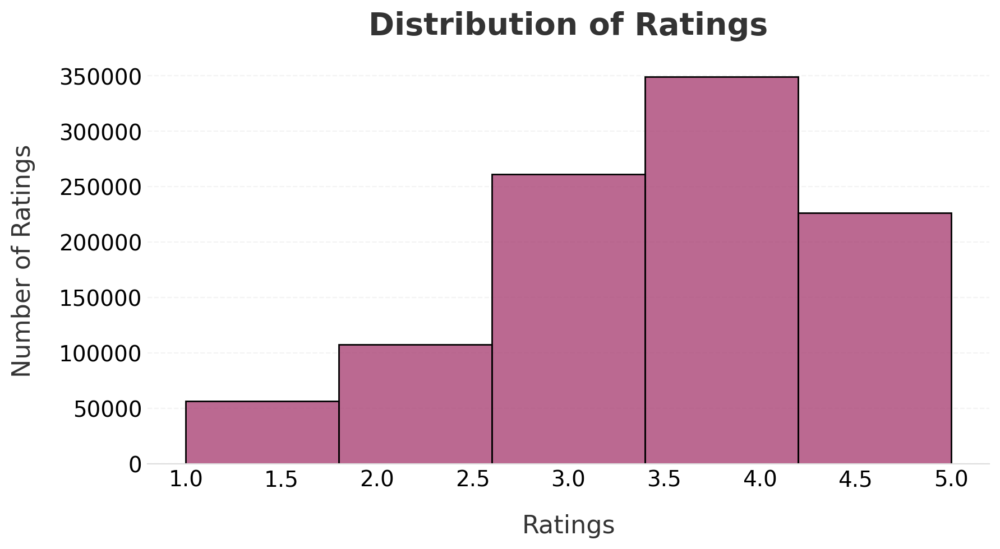

In [ ]:
# Average Rating
print("Average rating of ALL movies is", round(df['Rating'].mean(), 2))

# Ratings data
Ratings = df['Rating']

# Create the figure and axes
fig, ax = plt.subplots(figsize=(9, 5))

# Plot the histogram
sns.histplot(Ratings, bins=5, color=sns.color_palette("inferno")[2], edgecolor='black', alpha=0.7, ax=ax)

# Customize the bottom spine color
ax.spines['bottom'].set_color('#DDDDDD')

# Remove ticks
ax.tick_params(bottom=False, left=False)

# Ensure gridlines are below the bars
ax.set_axisbelow(True)
ax.xaxis.grid(False)

# Set title and labels
ax.set_title('Distribution of Ratings', pad=15)
ax.set_xlabel('Ratings', labelpad=15)
ax.set_ylabel('Number of Ratings', labelpad=15)

# Adjust layout to prevent clipping
fig.tight_layout()

# Display the plot
plt.show()

**2. Word Cloud Of Average Ratings by Genre**



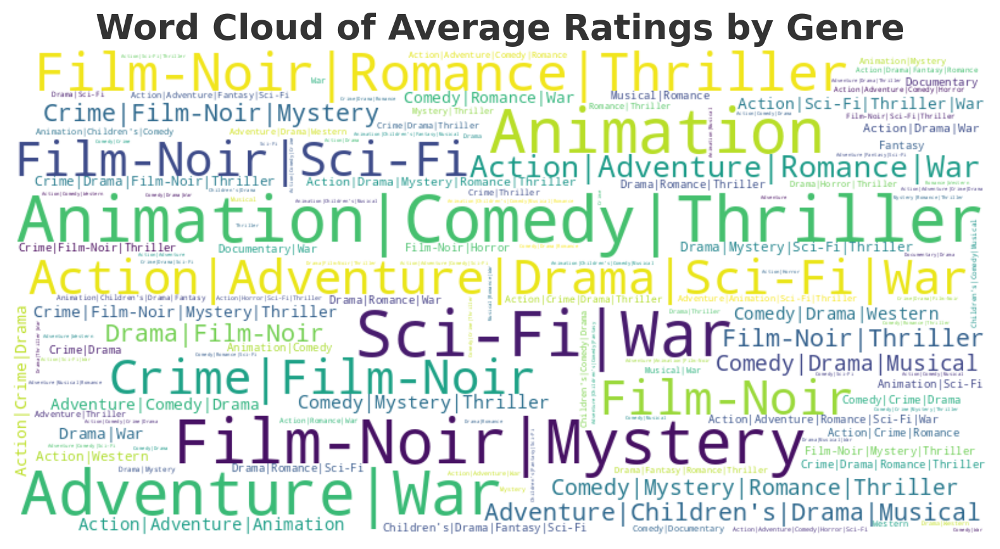

In [ ]:
# Calculate average rating per genre
genre_ratings = df.groupby('Genres')['Rating'].mean().reset_index()

# Sort by average rating
genre_ratings = genre_ratings.sort_values(by='Rating', ascending=False)
from wordcloud import WordCloud

# Create a dictionary of genres and their average ratings
word_freq = dict(zip(genre_ratings['Genres'], genre_ratings['Rating']))

# Generate a word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate_from_frequencies(word_freq)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide the axes
plt.title('Word Cloud of Average Ratings by Genre')
plt.show()



**3. Ratings by Age Group and Gender**


In [ ]:
import plotly.express as px

In [ ]:
age_bins = [0, 18, 25, 35, 45, 50, 56, 100]
age_labels = ['0-18', '19-24', '25-34', '35-44', '45-49', '50-55', '56+']
AgeGroup = pd.cut(df['Age'], bins=age_bins, labels=age_labels, right=False)

In [ ]:
fig = px.box(df, x=AgeGroup, y='Rating', color='Gender', title='Ratings by Age Group and Gender')
fig.show()


**4. Average Ratings and Number of Users by State**

In [ ]:
import pandas as pd

# Assuming 'zip' and 'state_id' (state abbreviations) are present in the ZIP code dataset
zip_codes['zip'] = zip_codes['zip'].astype(str)  # Ensure ZIP codes are strings
df1['Zip-code'] = df1['Zip-code'].astype(str)

# Merge the movie ratings dataset with the ZIP code dataset based on ZIP code
df1 = pd.merge(df1, zip_codes[['zip', 'state_id',]], left_on='Zip-code', right_on='zip', how='left')


# Drop unnecessary columns after merge
df1.drop(columns=['zip'], inplace=True)

In [ ]:
import pandas as pd
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Assuming df1 already contains state-wise data

# Step 1: Calculate the average rating per state
avg_rating_by_state = df1.groupby('state_id')['Rating'].mean().reset_index()

# Step 2: Calculate the number of users per state
num_users_by_state = df1.groupby('state_id')['UserID'].count().reset_index()
num_users_by_state.columns = ['state_id', 'num_users']

# Step 3: Merge the two dataframes on state_id
merged_data = avg_rating_by_state.merge(num_users_by_state, on='state_id')

# Step 4: Create subplots with two choropleth maps side by side
fig = make_subplots(rows=1, cols=2,
                    subplot_titles=("Average Rating by State", "Number of Ratings by State"),
                    specs=[[{'type': 'choropleth'}, {'type': 'choropleth'}]])

# Step 5: Create the first choropleth for average rating
fig.add_trace(
    go.Choropleth(
        locations=merged_data['state_id'],
        z=merged_data['Rating'],
        locationmode='USA-states',
        colorscale='Viridis',
        colorbar=dict(title="Avg Rating", x=0.45),  # Position the colorbar for the first map
        hovertemplate='<b>%{location}</b><br>' +
                      'Average Rating: %{z:.2f}<br>',
    ),
    row=1, col=1
)

# Step 6: Create the second choropleth for number of users
fig.add_trace(
    go.Choropleth(
        locations=merged_data['state_id'],
        z=merged_data['num_users'],
        locationmode='USA-states',
        colorscale='Viridis',
        colorbar=dict(title="Num Ratings", x=1.0),  # Position the colorbar for the second map
        hovertemplate='<b>%{location}</b><br>' +
                      'Number of Users: %{z}<br>',
    ),
    row=1, col=2
)

# Step 7: Update layout for the entire figure
fig.update_layout(
    title_text="Average Ratings and Number of Users by State",
    geo=dict(scope='usa'),
    geo2=dict(scope='usa')  # For the second plot
)

# Show the figure
fig.show()

**5. Popular vs. Niche Movies**

Correlation between number of ratings and average rating: 0.35795603728670733


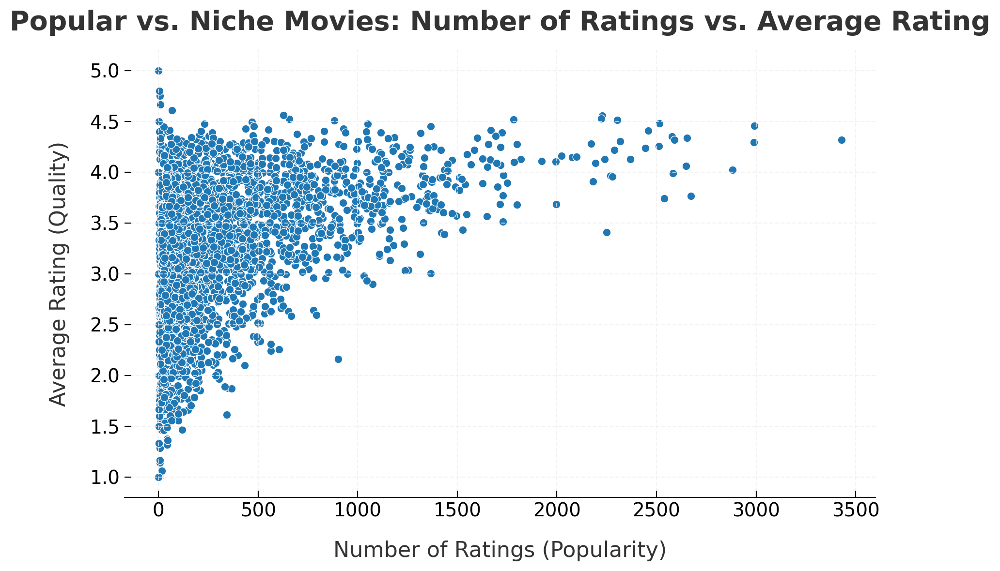

In [ ]:
# Step 1: Calculate the number of ratings (popularity) and average rating (quality) per movie
movie_stats = df.groupby('MovieID').agg(
    num_ratings=('Rating', 'count'),  # Count of ratings (popularity)
    avg_rating=('Rating', 'mean')     # Average rating (quality)
).reset_index()

# Step 2: Correlation between number of ratings and average rating
correlation = movie_stats['num_ratings'].corr(movie_stats['avg_rating'])
print(f"Correlation between number of ratings and average rating: {correlation}")

# Step 3: Visualize the relationship with a scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x='num_ratings', y='avg_rating', data=movie_stats)

plt.title('Popular vs. Niche Movies: Number of Ratings vs. Average Rating',pad=15, color='#333333',weight='bold')
plt.xlabel('Number of Ratings (Popularity)',labelpad=15, color='#333333')
plt.ylabel('Average Rating (Quality)',labelpad=15, color='#333333')
plt.show()

In [ ]:
avg_rating = df.groupby('MovieID')['Rating'].mean().sort_values(ascending=False)

**6. Distribution of Gender , Age and Occupation**

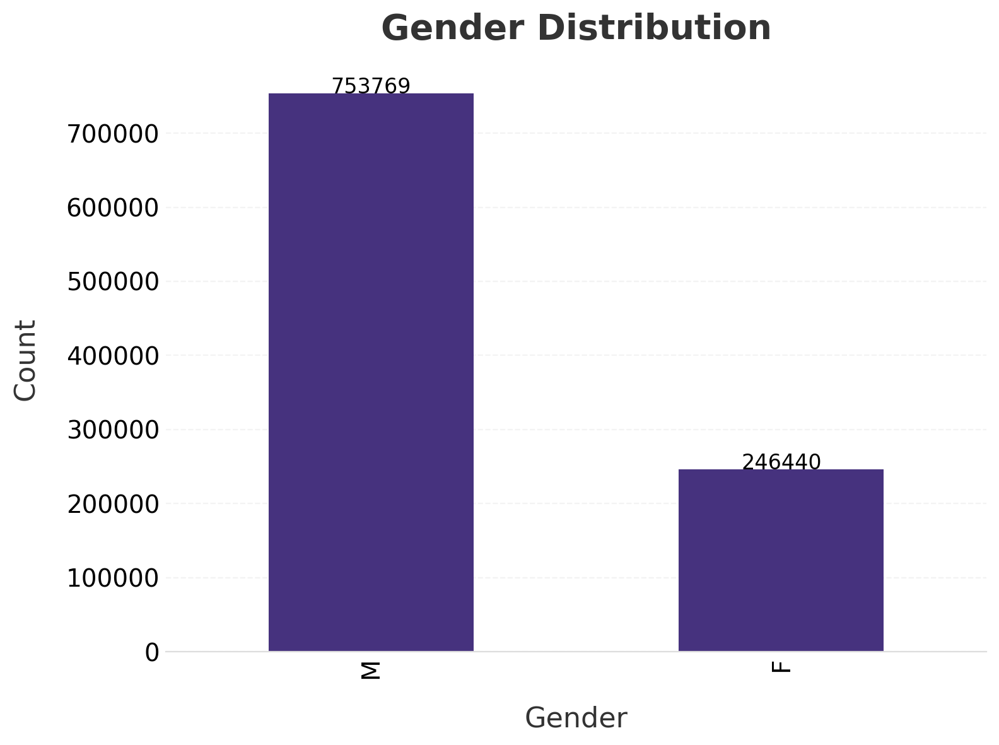

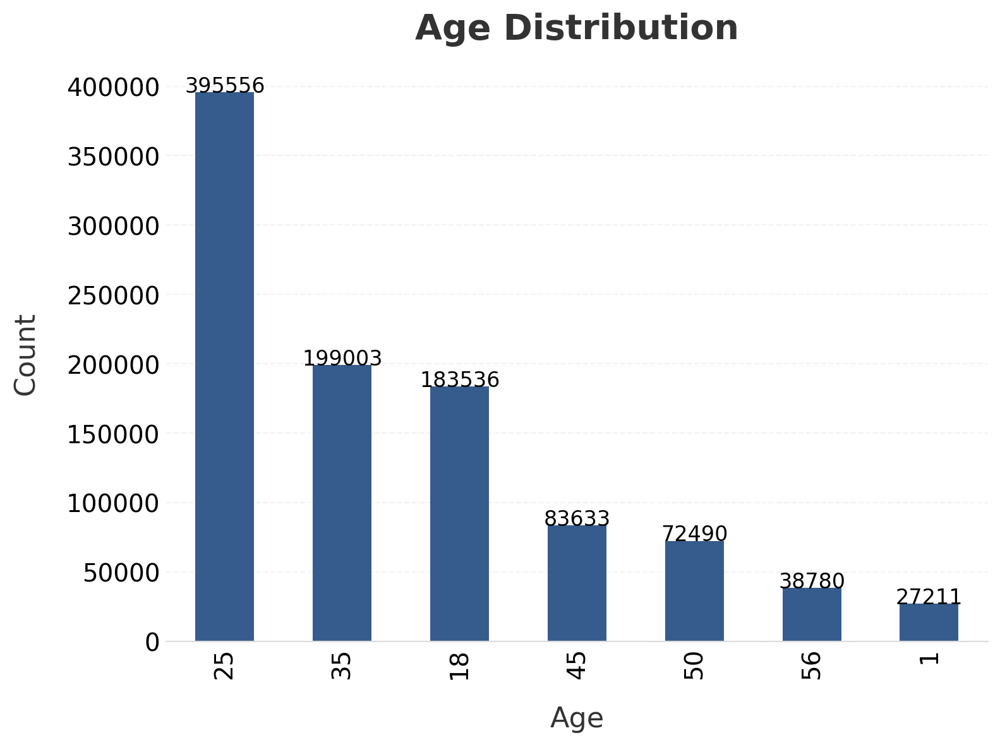

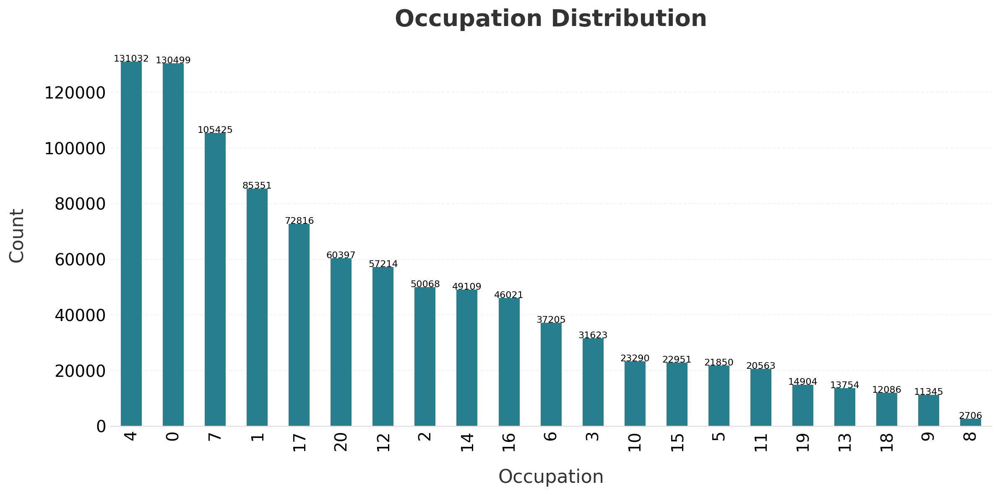

In [ ]:
# Plot Gender Distribution
fig, ax = plt.subplots(figsize=(8, 6))
df['Gender'].value_counts().plot(kind='bar', ax=ax, color=sns.color_palette("viridis")[0])

# Customize the bottom spine color
ax.spines['bottom'].set_color('#DDDDDD')

# Remove ticks
ax.tick_params(bottom=False, left=False)

# Ensure gridlines are below the bars
ax.set_axisbelow(True)
ax.xaxis.grid(False)
ax.yaxis.grid(True, color='#EEEEEE', linestyle='--', alpha=0.7)

# Set title and labels
ax.set_title('Gender Distribution', fontsize=20, fontweight='bold', color='#333333', pad=15)
ax.set_xlabel('Gender', fontsize=16, color='#333333', labelpad=15)
ax.set_ylabel('Count', fontsize=16, color='#333333', labelpad=15)

# Add text annotations on each bar
for bar in ax.patches:
    ax.text(
        bar.get_x() + bar.get_width() / 2,  # X position of the text
        bar.get_height() + 1,                # Y position of the text
        f'{int(bar.get_height())}',          # Text to display
        ha='center',                          # Horizontal alignment
        color='black',                        # Color of the text
        fontsize=12                           # Font size
    )

# Adjust layout to prevent clipping
fig.tight_layout()

# Display the plot
plt.show()

# Plot Age Distribution
fig, ax = plt.subplots(figsize=(8, 6))
df['Age'].value_counts().plot(kind='bar', ax=ax, color=sns.color_palette("viridis")[1])

# Customize the bottom spine color
ax.spines['bottom'].set_color('#DDDDDD')

# Remove ticks
ax.tick_params(bottom=False, left=False)

# Ensure gridlines are below the bars
ax.set_axisbelow(True)
ax.xaxis.grid(False)
ax.yaxis.grid(True, color='#EEEEEE', linestyle='--', alpha=0.7)

# Set title and labels
ax.set_title('Age Distribution', fontsize=20, fontweight='bold', color='#333333', pad=15)
ax.set_xlabel('Age', fontsize=16, color='#333333', labelpad=15)
ax.set_ylabel('Count', fontsize=16, color='#333333', labelpad=15)

# Add text annotations on each bar
for bar in ax.patches:
    ax.text(
        bar.get_x() + bar.get_width() / 2,  # X position of the text
        bar.get_height() + 1,                # Y position of the text
        f'{int(bar.get_height())}',          # Text to display
        ha='center',                          # Horizontal alignment
        color='black',                        # Color of the text
        fontsize=12                           # Font size
    )

# Adjust layout to prevent clipping
fig.tight_layout()

# Display the plot
plt.show()

# Plot Occupation Distribution
fig, ax = plt.subplots(figsize=(12, 6))
df['Occupation'].value_counts().plot(kind='bar', ax=ax, color=sns.color_palette("viridis")[2])

# Customize the bottom spine color
ax.spines['bottom'].set_color('#DDDDDD')

# Remove ticks
ax.tick_params(bottom=False, left=False)

# Ensure gridlines are below the bars
ax.set_axisbelow(True)
ax.xaxis.grid(False)
ax.yaxis.grid(True, color='#EEEEEE', linestyle='--', alpha=0.7)

# Set title and labels
ax.set_title('Occupation Distribution', fontsize=20, fontweight='bold', color='#333333', pad=15)
ax.set_xlabel('Occupation', fontsize=16, color='#333333', labelpad=15)
ax.set_ylabel('Count', fontsize=16, color='#333333', labelpad=15)

# Add text annotations on each bar
for bar in ax.patches:
    ax.text(
        bar.get_x() + bar.get_width() / 2,  # X position of the text
        bar.get_height() + 1,                # Y position of the text
        f'{int(bar.get_height())}',          # Text to display
        ha='center',                          # Horizontal alignment
        color='black',                        # Color of the text
        fontsize=8                           # Font size
    )

# Adjust layout to prevent clipping
fig.tight_layout()

# Display the plot
plt.show()

**7. Most Rated Movies**

In [ ]:
most_rated = df.groupby('MovieID')['Rating'].count().sort_values(ascending=False).head(10)

<Axes: xlabel='MovieID'>

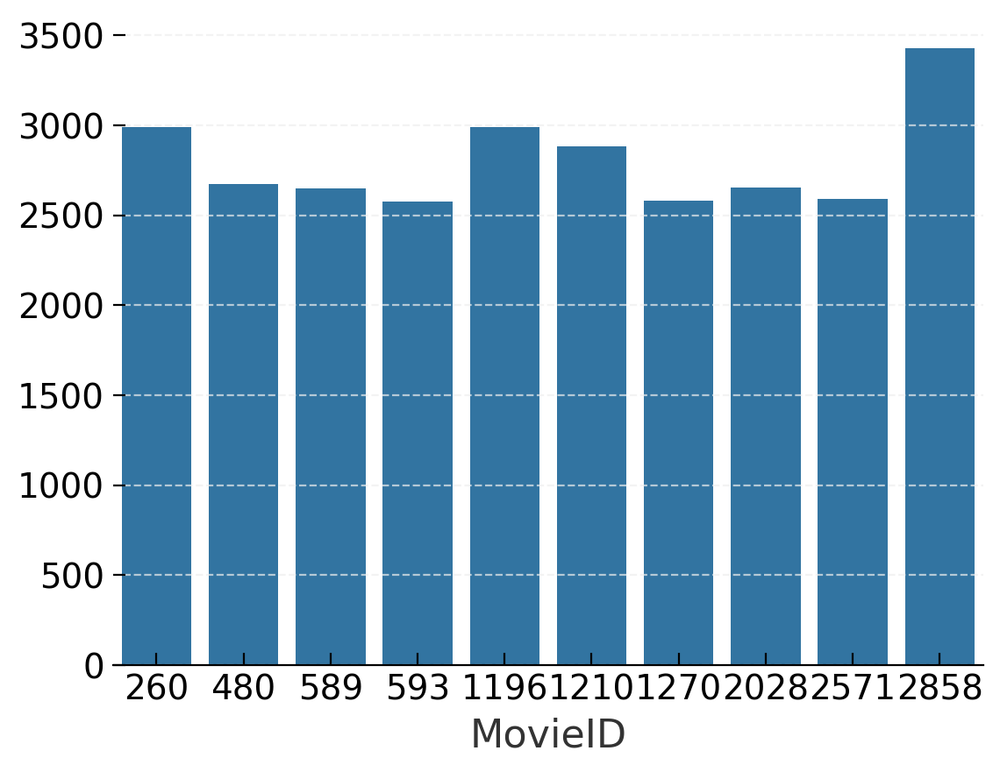

In [ ]:
most_rated_movies = df[df['MovieID'].isin(most_rated.index)]['Title'].unique()
sns.barplot(x=most_rated.index, y=most_rated.values)

**8. Number Of Rating per Year**

<Axes: title={'center': 'Number Of Ratings Over Time'}, xlabel='Year'>

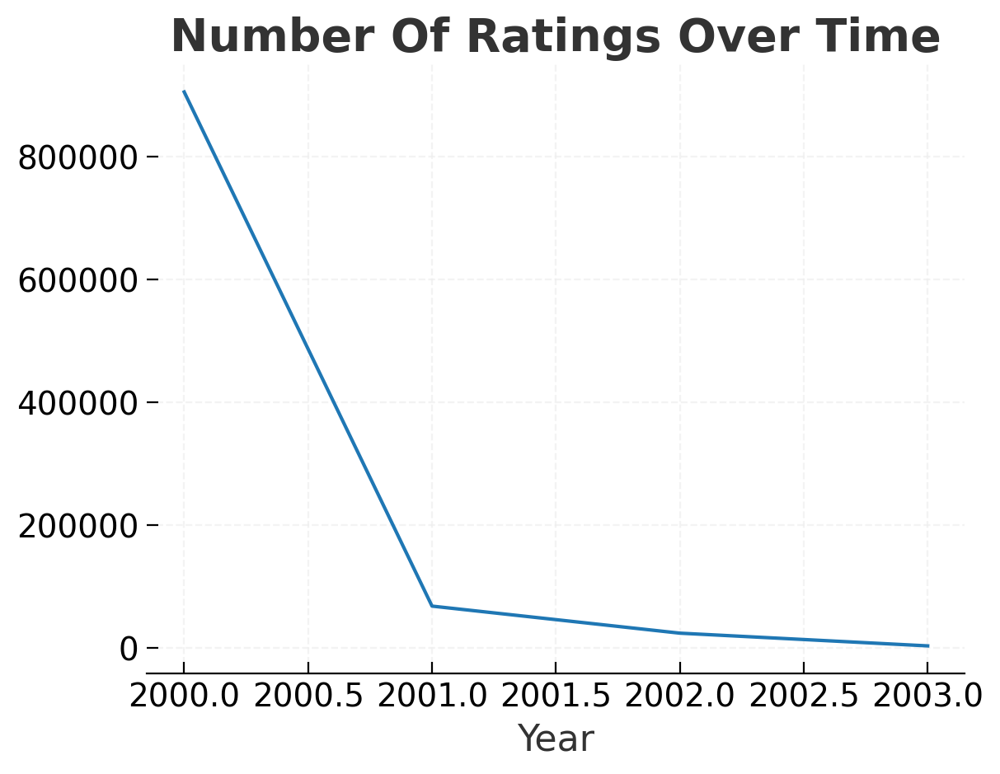

In [ ]:
df['Year'] = df['Timestamp'].dt.year
ratings_per_year = df.groupby('Year')['Rating'].count()
ratings_per_year.plot(kind='line', title='Number Of Ratings Over Time')

**9. Distribution of Movies according to Release Year**

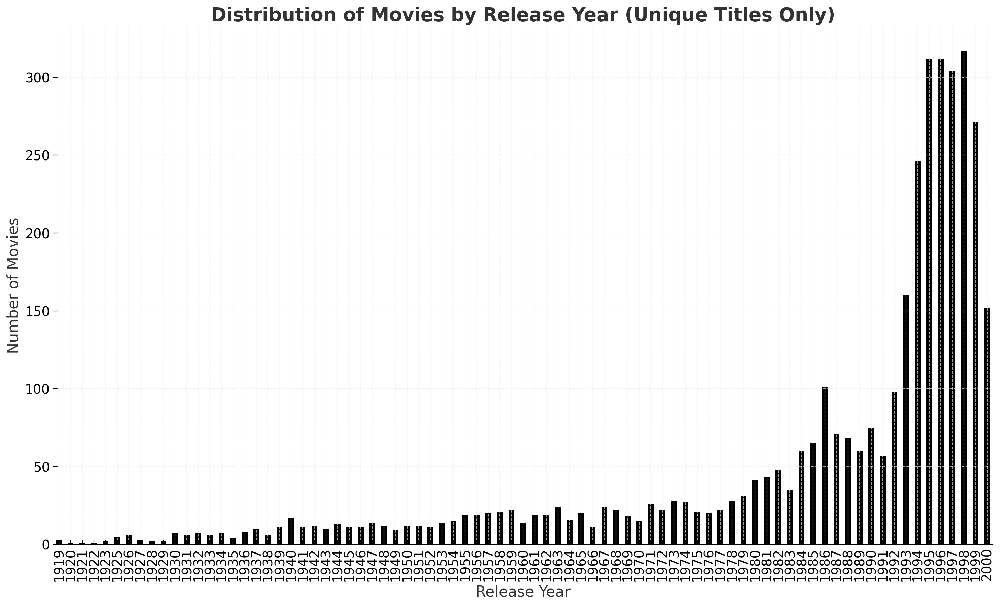

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import re

# Assuming you have a dataframe 'df' with a 'Title' column
def extract_release_year(title):
    """Extract release year from movie title assuming format 'Movie Title (Year)'."""
    match = re.search(r'\((\d{4})\)', title)
    if match:
        return int(match.group(1))
    return None

# Step 1: Drop duplicate movie titles to ensure uniqueness
df_unique_titles = df.drop_duplicates(subset=['Title'])

# Step 2: Apply the function to create a new 'Release_Year' column
df_unique_titles['Release_Year'] = df_unique_titles['Title'].apply(extract_release_year)

# Step 3: Drop rows with missing release years
df_unique_titles.dropna(subset=['Release_Year'], inplace=True)

# Step 4: Plot distribution of movies by release year for unique titles only
def plot_release_year_distribution(df):
    plt.figure(figsize=(18, 10))
    df['Release_Year'].value_counts().sort_index().plot(kind='bar',color='black')
    plt.title('Distribution of Movies by Release Year (Unique Titles Only)')
    plt.xlabel('Release Year')
    plt.ylabel('Number of Movies')
    plt.show()

# Call the function with the dataframe containing unique titles
plot_release_year_distribution(df_unique_titles)

**10. Most Watched Movies**

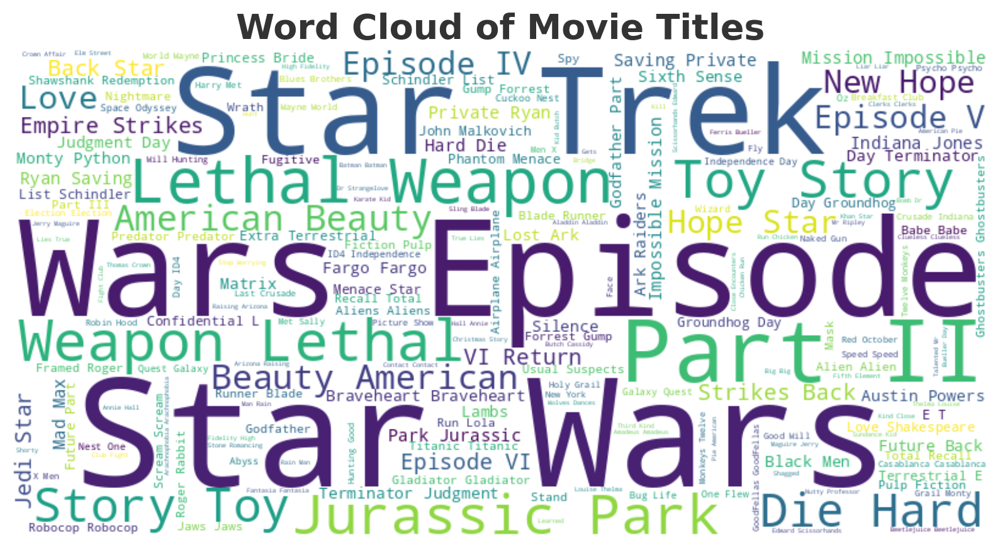

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Function to generate a word cloud from movie titles
def plot_wordcloud(df):
    all_titles = ' '.join(df['Title'].values)
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_titles)

    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title('Word Cloud of Movie Titles')
    plt.show()

# Call the function
plot_wordcloud(df)

**1.Encoding for feature Genres**

In [ ]:
genres_list = [
    "Action", "Adventure", "Animation", "Children's", "Comedy", "Crime",
    "Documentary", "Drama", "Fantasy", "Film-Noir", "Horror", "Musical",
    "Mystery", "Romance", "Sci-Fi", "Thriller", "War", "Western"
]

genre_to_bit = {genre: 2**i for i, genre in enumerate(genres_list)}

def encode_genres(genres_str):
    genres = genres_str.split('|')
    return sum(genre_to_bit[genre] for genre in genres)

df['genres_encoded'] = df['Genres'].apply(encode_genres)

def decode_genres(encoded_value):
    genres = [genre for genre, bit_value in genre_to_bit.items() if encoded_value & bit_value]
    return '|'.join(genres)

# df['decoded_genres'] = df['genres_encoded'].apply(decode_genres)

df.head()


,MovieID,Title,Genres,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code,Year,genres_encoded
0,1,Toy Story (1995),Animation|Children's|Comedy,1,5,2001-01-06 23:37:48,F,1,10,48067,2001,28
1,1,Toy Story (1995),Animation|Children's|Comedy,6,4,2000-12-31 04:30:08,F,50,9,55117,2000,28
2,1,Toy Story (1995),Animation|Children's|Comedy,8,4,2000-12-31 03:31:36,M,25,12,11413,2000,28
3,1,Toy Story (1995),Animation|Children's|Comedy,9,5,2000-12-31 01:25:52,M,25,17,61614,2000,28
4,1,Toy Story (1995),Animation|Children's|Comedy,10,5,2000-12-31 01:34:34,F,35,1,95370,2000,28


**2.Encoding for Feature Gender**

In [ ]:
from sklearn.preprocessing import LabelEncoder

le_gender = LabelEncoder()

df['Gender'] = le_gender.fit_transform(df['Gender'])

df.head()

df_1 = df

**3. Remoing duplicate columns**

In [ ]:
df = df.drop(['Year'],axis=1)

In [ ]:
df

,MovieID,Title,Genres,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code,genres_encoded
0,1,Toy Story (1995),Animation|Children's|Comedy,1,5,2001-01-06 23:37:48,0,1,10,48067,28
1,1,Toy Story (1995),Animation|Children's|Comedy,6,4,2000-12-31 04:30:08,0,50,9,55117,28
2,1,Toy Story (1995),Animation|Children's|Comedy,8,4,2000-12-31 03:31:36,1,25,12,11413,28
3,1,Toy Story (1995),Animation|Children's|Comedy,9,5,2000-12-31 01:25:52,1,25,17,61614,28
4,1,Toy Story (1995),Animation|Children's|Comedy,10,5,2000-12-31 01:34:34,0,35,1,95370,28
...,...,...,...,...,...,...,...,...,...,...,...
1000204,3952,"Contender, The (2000)",Drama|Thriller,5812,4,2001-06-09 07:34:59,0,25,7,92120,32896
1000205,3952,"Contender, The (2000)",Drama|Thriller,5831,3,2001-04-02 14:52:05,1,25,1,92120,32896
1000206,3952,"Contender, The (2000)",Drama|Thriller,5837,4,2002-01-24 20:04:16,1,25,7,60607,32896
1000207,3952,"Contender, The (2000)",Drama|Thriller,5927,1,2001-01-18 21:15:37,1,35,14,10003,32896


# Correlation Matrix

In [ ]:
numerical_cols = df.select_dtypes(include=['int64', 'float64','datetime64[ns]']).columns
df_numerical = df[numerical_cols]

# Calculate the correlation matrix
correlation_matrix = df_numerical.corr()
print(correlation_matrix)


                 MovieID    UserID    Rating  Timestamp    Gender       Age  \
MovieID         1.000000 -0.017739 -0.064042   0.041632  0.021626  0.027575   
UserID         -0.017739  1.000000  0.012303  -0.490383 -0.035042  0.034688   
Rating         -0.064042  0.012303  1.000000  -0.026770 -0.019861  0.056869   
Timestamp       0.041632 -0.490383 -0.026770   1.000000 -0.008895 -0.064562   
Gender          0.021626 -0.035042 -0.019861  -0.008895  1.000000 -0.003189   
Age             0.027575  0.034688  0.056869  -0.064562 -0.003189  1.000000   
Occupation      0.008585 -0.026698  0.006753   0.015646  0.114974  0.078371   
genres_encoded -0.089915  0.004511  0.039620  -0.024055  0.056578  0.042468   

                Occupation  genres_encoded  
MovieID           0.008585       -0.089915  
UserID           -0.026698        0.004511  
Rating            0.006753        0.039620  
Timestamp         0.015646       -0.024055  
Gender            0.114974        0.056578  
Age               

**Heatmap**

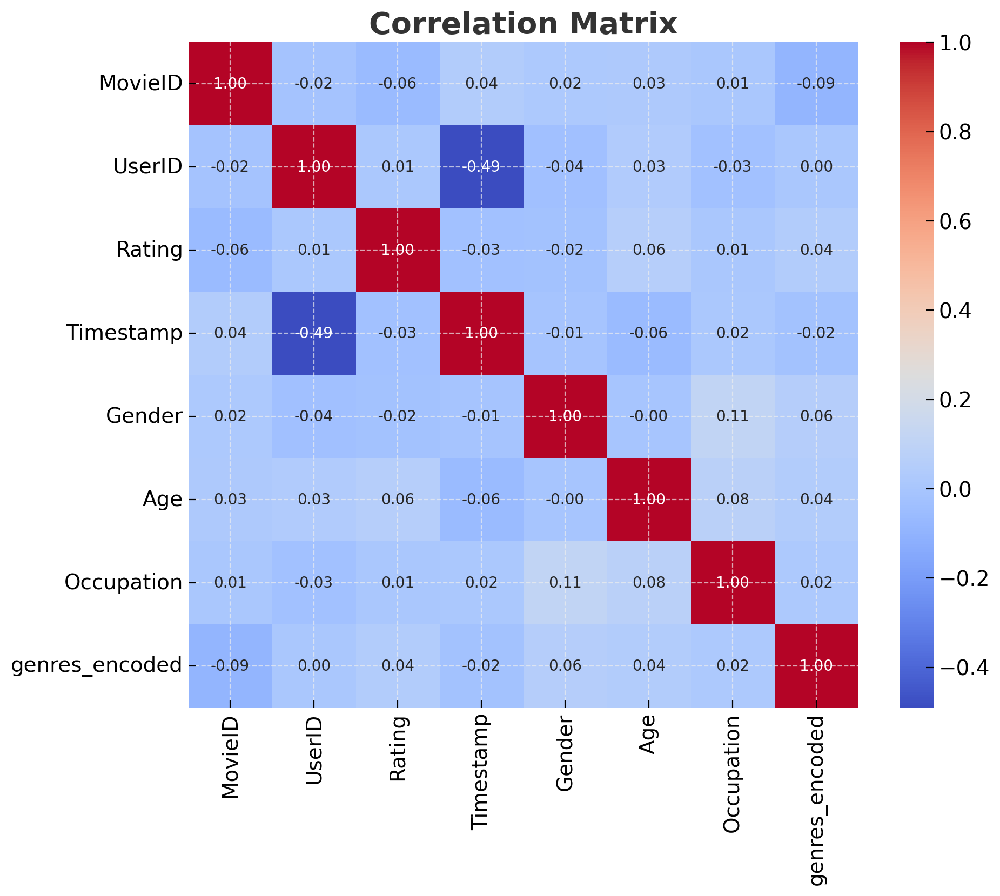

In [ ]:
# Visualize the correlation matrix using a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

# Common Support and Sparsity

**1. Common Support**

*  The common support is the number of reviewers who rated both items.It is very usefull in Movie Recommendation System.Specifically, if the common support is 0 for a pair of movies, then it is quite hard to find their similarity!

Average common support is 28.33


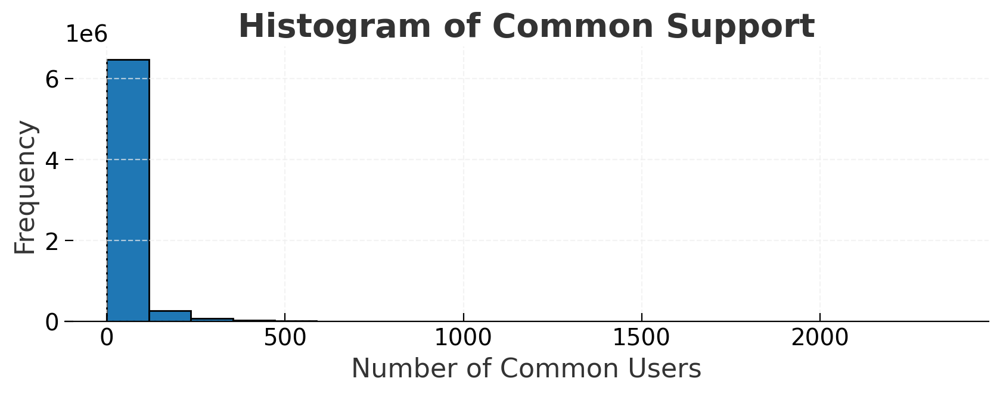

In [ ]:
# Create a pivot table with users as rows and movies as columns
pivot_table = df.pivot_table(index='UserID', columns='MovieID', values='Rating', fill_value=0)
binary_table = (pivot_table > 0).astype(int)
# print(binary_table)

# Calculate common support using matrix multiplication
common_support_matrix = np.dot(binary_table.T, binary_table)

# Extract the upper triangle of the common support matrix to avoid duplicates
upper_triangle_indices = np.triu_indices_from(common_support_matrix, k=1)
# print(upper_triangle_indices)
t1g_allpair_commonsupport = common_support_matrix[upper_triangle_indices]

# Print the average common support
print(f"Average common support is {round(np.mean(t1g_allpair_commonsupport), 2)}")

# Plot histogram of common support
plt.figure(figsize=(10, 3))
counts, bin_edges, _ = plt.hist(t1g_allpair_commonsupport, bins=20, edgecolor='black')
# bin_size = bin_edges[1] - bin_edges[0]
# print(bin_size)
plt.title('Histogram of Common Support')
plt.xlabel('Number of Common Users')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


**2. Sparsity**

In [ ]:
num_nonzero_entries = np.count_nonzero(pivot_table)

# Total possible entries (users * movies)
num_total_entries = pivot_table.size

# Calculate sparsity
sparsity = 1 - (num_nonzero_entries / num_total_entries)

print(f"Sparsity of the dataset is {sparsity:.4f}")

Sparsity of the dataset is 0.9553


# Nearest Neighbor based Recommender System

In [ ]:
df_unique = df.drop_duplicates(subset='Title')

# Create the dictionary and list from the DataFrame
movie_name_to_id_dictionary = dict(zip(df_unique['Title'], df_unique['MovieID']))
all_movie_names = df_unique['Title'].tolist()

# Print the dictionary and list to verify
print(movie_name_to_id_dictionary)
print(all_movie_names)

{'Toy Story (1995)': 1, 'Jumanji (1995)': 2, 'Grumpier Old Men (1995)': 3, 'Waiting to Exhale (1995)': 4, 'Father of the Bride Part II (1995)': 5, 'Heat (1995)': 6, 'Sabrina (1995)': 7, 'Tom and Huck (1995)': 8, 'Sudden Death (1995)': 9, 'GoldenEye (1995)': 10, 'American President, The (1995)': 11, 'Dracula: Dead and Loving It (1995)': 12, 'Balto (1995)': 13, 'Nixon (1995)': 14, 'Cutthroat Island (1995)': 15, 'Casino (1995)': 16, 'Sense and Sensibility (1995)': 17, 'Four Rooms (1995)': 18, 'Ace Ventura: When Nature Calls (1995)': 19, 'Money Train (1995)': 20, 'Get Shorty (1995)': 21, 'Copycat (1995)': 22, 'Assassins (1995)': 23, 'Powder (1995)': 24, 'Leaving Las Vegas (1995)': 25, 'Othello (1995)': 26, 'Now and Then (1995)': 27, 'Persuasion (1995)': 28, 'City of Lost Children, The (1995)': 29, 'Shanghai Triad (Yao a yao yao dao waipo qiao) (1995)': 30, 'Dangerous Minds (1995)': 31, 'Twelve Monkeys (1995)': 32, 'Wings of Courage (1995)': 33, 'Babe (1995)': 34, 'Carrington (1995)': 35, '

In [ ]:
def get_movie_reviews(movie_id, common_users):
    #Get a boolean vector for df provided by users in common_users for movie in movie_id

    mask = (df['UserID'].isin(common_users)) & (df['MovieID'] == movie_id)

    #Creating a subset of data where the mask is True i.e. only collect data from users who satisfy the condition above
    # Then sort them based on userid
    movie_ratings = df[mask].sort_values('UserID')

    #Returning the unique set of ratings provided
    movie_ratings = movie_ratings[movie_ratings['UserID'].duplicated()==False]
    return movie_ratings

In [ ]:
display( get_movie_reviews(1, set([1])) )

display( get_movie_reviews(1, set(range(1, 10))) )

,MovieID,Title,Genres,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code,genres_encoded
0,1,Toy Story (1995),Animation|Children's|Comedy,1,5,2001-01-06 23:37:48,0,1,10,48067,28


,MovieID,Title,Genres,UserID,Rating,Timestamp,Gender,Age,Occupation,Zip-code,genres_encoded
0,1,Toy Story (1995),Animation|Children's|Comedy,1,5,2001-01-06 23:37:48,0,1,10,48067,28
1,1,Toy Story (1995),Animation|Children's|Comedy,6,4,2000-12-31 04:30:08,0,50,9,55117,28
2,1,Toy Story (1995),Animation|Children's|Comedy,8,4,2000-12-31 03:31:36,1,25,12,11413,28
3,1,Toy Story (1995),Animation|Children's|Comedy,9,5,2000-12-31 01:25:52,1,25,17,61614,28


In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import euclidean_distances

In [ ]:
def calculate_similarity(movie_name_1, movie_name_2, min_common_users=0):

    movie1 = movie_name_to_id_dictionary[movie_name_1]
    movie2 = movie_name_to_id_dictionary[movie_name_2]

    #This is the set of UNIQUE user ids  who reviewed  movie1
    users_who_rated_movie1 = df[df['MovieID'] == movie1]['UserID'].unique()

    #This is the set of UNIQUE user ids  who reviewed  movie2
    users_who_rated_movie2 = df[df['MovieID'] == movie2]['UserID'].unique()

    #Compute the common users who rated both movies:
    common_users = set(users_who_rated_movie1).intersection(users_who_rated_movie2)

    #getting the reviews for the movies and common users
    movie1_reviews = get_movie_reviews(movie1, common_users)
    movie2_reviews = get_movie_reviews(movie2, common_users)

    movie1_ratings = movie1_reviews['Rating'].values
    movie2_ratings = movie2_reviews['Rating'].values

    # Check if the number of common users is below the minimum required
    if len(common_users) < min_common_users:
        return [[float('inf')]]

    # Use the euclidean_distances function to compute the distance
    distance = euclidean_distances(movie1_ratings.reshape(1, -1), movie2_ratings.reshape(1, -1))

    # Return the first element of the distance matrix
    return distance[0][0]

In [ ]:
print(calculate_similarity("Toy Story (1995)", "GoldenEye (1995)"))
print(calculate_similarity("GoldenEye (1995)", "Tomorrow Never Dies (1997)"))
print(calculate_similarity("Batman Forever (1995)", "Batman & Robin (1997)"))

31.0322412983658
17.88854381999832
23.40939982143925


In [ ]:
def get_top_k_similar_movies(input_movie_name, k=5, min_common_users=0):
    movie_similarity = []
    for movie_name in all_movie_names:
        if input_movie_name == movie_name:
            continue
        similarity = calculate_similarity(input_movie_name, movie_name, min_common_users)
        movie_similarity.append( (similarity, movie_name) )
    return sorted(movie_similarity)[:k]

In [ ]:
print("\nMovies similar to GoldenEye [25]", get_top_k_similar_movies("GoldenEye (1995)", 10, 25))
print("\nMovies similar to GoldenEye [50]", get_top_k_similar_movies("GoldenEye (1995)", 10, 50))


Movies similar to GoldenEye [25] [(4.242640687119285, 'Moll Flanders (1996)'), (4.358898943540674, 'Dorado, El (1967)'), (4.47213595499958, 'Captain Horatio Hornblower (1951)'), (4.58257569495584, 'Girlfight (2000)'), (4.898979485566356, 'Ipcress File, The (1965)'), (4.898979485566356, "MacKenna's Gold (1969)"), (4.898979485566356, 'Torn Curtain (1966)'), (5.0, 'Betrayed (1988)'), (5.196152422706632, 'Bridge at Remagen, The (1969)'), (5.291502622129181, 'In Too Deep (1999)')]

Movies similar to GoldenEye [50] [(7.0710678118654755, 'North Dallas Forty (1979)'), (7.416198487095663, 'Trouble with Harry, The (1955)'), (7.483314773547883, "Soldier's Story, A (1984)"), (7.54983443527075, 'Outside Providence (1999)'), (7.54983443527075, 'Tough Guys (1986)'), (7.615773105863909, 'Buddy Holly Story, The (1978)'), (7.681145747868608, 'Playing God (1997)'), (7.681145747868608, 'Postman Always Rings Twice, The (1981)'), (7.681145747868608, 'Wings of the Dove, The (1997)'), (7.745966692414834, 'Bo

# Item Based Collabrative Filtering

In [ ]:
def euclidean_distance_normed(vec1, vec2):
    if len(vec1) == 0:
        return 0.0
    euc_distance = euclidean_distances(vec1, vec2)[0][0]
    return 1.0 / (1.0 + euc_distance)

In [ ]:
def calculate_similarity_normed(movie_name_1, movie_name_2, min_common_users=0):
    movie1 = movie_name_to_id_dictionary[movie_name_1]
    movie2 = movie_name_to_id_dictionary[movie_name_2]

    #This is the set of UNIQUE user ids  who reviewed  movie1
    users_who_rated_movie1 = df[df['MovieID'] == movie1]['UserID'].unique()

    #This is the set of UNIQUE user ids  who reviewed  movie2
    users_who_rated_movie2 = df[df['MovieID'] == movie2]['UserID'].unique()

    #Compute the common users who rated both movies:
    common_users = set(users_who_rated_movie1).intersection(users_who_rated_movie2)

    #get the reviews for the movies and common users
    movie1_reviews = get_movie_reviews(movie1, common_users)
    movie2_reviews = get_movie_reviews(movie2, common_users)


    distance = euclidean_distance_normed(movie1_reviews['Rating'].values.reshape(1,-1), movie2_reviews['Rating'].values.reshape(1,-1))

    if len(common_users) < min_common_users:
        return 0.0
    return distance

In [ ]:
print(calculate_similarity_normed("Toy Story (1995)", "GoldenEye (1995)"))
print(calculate_similarity_normed("GoldenEye (1995)", "Tomorrow Never Dies (1997)"))
print(calculate_similarity_normed("Batman Forever (1995)", "Batman & Robin (1997)"))

0.031218546048197297
0.05294214363635836
0.040967824170821295


In [ ]:
from collections import defaultdict
movie_similarity_hash = defaultdict(dict)

In [ ]:
import pandas as pd
from collections import Counter

def top_k_movie_names(k, df=df):
    # Group by 'Title' and count the number of ratings for each movie
    movie_ratings_counter = df.groupby('Title').size()

    # Get the top k movies based on the count of ratings
    top_k_movies = movie_ratings_counter.nlargest(k)

    # Return as a list of tuples (movie_name, count)
    return list(top_k_movies.items())

In [ ]:
print("Top-10", top_k_movie_names(10), "\n")

Top-10 [('American Beauty (1999)', 3428), ('Star Wars: Episode IV - A New Hope (1977)', 2991), ('Star Wars: Episode V - The Empire Strikes Back (1980)', 2990), ('Star Wars: Episode VI - Return of the Jedi (1983)', 2883), ('Jurassic Park (1993)', 2672), ('Saving Private Ryan (1998)', 2653), ('Terminator 2: Judgment Day (1991)', 2649), ('Matrix, The (1999)', 2590), ('Back to the Future (1985)', 2583), ('Silence of the Lambs, The (1991)', 2578)] 



In [ ]:
top_250_movie_names = [item[0] for item in top_k_movie_names(250)]

In [ ]:
def compute_movie_to_movie_similarity(movie_names, min_common_users=0):
    for movie_name_1 in movie_names:
        for movie_name_2 in movie_names:
            if movie_name_1 == movie_name_2:
                continue
            similarity = calculate_similarity_normed(movie_name_1, movie_name_2, min_common_users)
            movie_similarity_hash[movie_name_1][movie_name_2] = similarity
            movie_similarity_hash[movie_name_2][movie_name_1] = similarity

In [ ]:
# import time

# def compute_movie_to_movie_similarity(movie_names, min_common_users=0):
#     total_tasks = len(movie_names) * (len(movie_names) - 1) // 2  # Total unique movie pairs
#     completed_tasks = 0
#     start_time = time.time()

#     for i, movie_name_1 in enumerate(movie_names):
#         for j in range(i + 1, len(movie_names)):
#             movie_name_2 = movie_names[j]
#             similarity = calculate_similarity_normed(movie_name_1, movie_name_2, min_common_users)
#             movie_similarity_hash[movie_name_1][movie_name_2] = similarity
#             movie_similarity_hash[movie_name_2][movie_name_1] = similarity
#             completed_tasks += 1
#             elapsed_time = time.time() - start_time

#             # Print progress
#             print(f"Completed {completed_tasks}/{total_tasks} tasks ({(completed_tasks / total_tasks) * 100:.2f}%)")
#             print(f"Elapsed time: {elapsed_time:.2f} seconds")



In [ ]:
movie_similarity_hash = defaultdict(dict)
# let use the top-10 movies
compute_movie_to_movie_similarity(top_250_movie_names[:10], min_common_users=0)

#Get similarity with
display(movie_similarity_hash["Matrix, The (1999)"])
display(movie_similarity_hash['Star Wars: Episode VI - Return of the Jedi (1983)'])

print(movie_similarity_hash["Matrix, The (1999)"]["Silence of the Lambs, The (1991)"])

{'American Beauty (1999)': 0.0197085808579796,
 'Star Wars: Episode IV - A New Hope (1977)': 0.021247134005244736,
 'Star Wars: Episode V - The Empire Strikes Back (1980)': 0.021092060168829155,
 'Star Wars: Episode VI - Return of the Jedi (1983)': 0.020177871094067008,
 'Jurassic Park (1993)': 0.01745387366797673,
 'Saving Private Ryan (1998)': 0.020768992320659374,
 'Terminator 2: Judgment Day (1991)': 0.020395160379050873,
 'Back to the Future (1985)': 0.020601796058441278,
 'Silence of the Lambs, The (1991)': 0.021516820514566177}

{'American Beauty (1999)': 0.01843178406447174,
 'Star Wars: Episode IV - A New Hope (1977)': 0.023927935122514902,
 'Star Wars: Episode V - The Empire Strikes Back (1980)': 0.026075824098971447,
 'Jurassic Park (1993)': 0.020750719162618,
 'Saving Private Ryan (1998)': 0.02177598160160258,
 'Terminator 2: Judgment Day (1991)': 0.021311124294506704,
 'Matrix, The (1999)': 0.020177871094067008,
 'Back to the Future (1985)': 0.022188629094828133,
 'Silence of the Lambs, The (1991)': 0.0216038865838522}

0.021516820514566177


**Here below code is for creating movie similarity hash but  This take around 40 to 50 minutestakes so we dump outcome of this and save it and below by using pickle we are retreiving and seeing and using this movie similarity hash so we dont neet to run it again and again**

In [ ]:
# movie_similarity_hash = defaultdict(dict)
# compute_movie_to_movie_similarity(top_250_movie_names, min_common_users=25)
# #This might take 10-20 mins to run!

In [ ]:
# https://drive.google.com/file/d/1Pm2FzoZjvBiP8b8cYDRQOkFyHZyecIhy/view?usp=drive_link

In [ ]:
# Step 1: Download the file

# File ID from the Google Drive link
file_id = '1Pm2FzoZjvBiP8b8cYDRQOkFyHZyecIhy'
url = f'https://drive.google.com/uc?id={file_id}'
output = 'movie_similarity.pickle'

# Check if the file already exists
if not os.path.exists(output):
    # Download the file if it doesn't exist
    gdown.download(url, output, quiet=False)
else:
    print(f"File '{output}' already exists. Skipping download.")



Downloading...
From: https://drive.google.com/uc?id=1Pm2FzoZjvBiP8b8cYDRQOkFyHZyecIhy
To: /content/movie_similarity.pickle
100%|██████████| 1.02M/1.02M [00:00<00:00, 95.2MB/s]


In [ ]:
import pickle
# Let us persist the movie-movie similarity data structure
# that way you dont need to re-run the whole thing
#pickle is a serialization library in Python
# To persist/serialize, use the following line
# pickle.dump(movie_similarity_hash, open("movie_similarity.pickle", "wb"))
# To deserialize, uncomment the following line
movie_similarity_hash = pickle.load(open(output, "rb" ))

In [ ]:
import operator
for movie_name in top_250_movie_names[:10]:
    print("Top-10 most similar movies for ", movie_name, " :",)
    print(sorted(movie_similarity_hash[movie_name].items(), key=operator.itemgetter(1), reverse=True)[:10])
    print("\n")

Top-10 most similar movies for  American Beauty (1999)  :
[('Bridge on the River Kwai, The (1957)', 0.0345894234883107), ('Cool Hand Luke (1967)', 0.03364419081637153), ('Almost Famous (2000)', 0.03310582597772355), ('African Queen, The (1951)', 0.03220616230890625), ('Rear Window (1954)', 0.03210311328564171), ('Professional, The (a.k.a. Leon: The Professional) (1994)', 0.03188322790594783), ('Glory (1989)', 0.031553685979219565), ('Boat, The (Das Boot) (1981)', 0.031521296915667484), ('Maltese Falcon, The (1941)', 0.03136085039135467), ('Platoon (1986)', 0.03078803280544888)]


Top-10 most similar movies for  Star Wars: Episode IV - A New Hope (1977)  :
[('Almost Famous (2000)', 0.037116433842478716), ('Bridge on the River Kwai, The (1957)', 0.03667322361847227), ('Maltese Falcon, The (1941)', 0.03557341065865384), ('Boat, The (Das Boot) (1981)', 0.035273880404758616), ('Sting, The (1973)', 0.034675480380038905), ('Rear Window (1954)', 0.034482758620689655), ('Cool Hand Luke (1967)',

<h3>This part is used in both user based and item based</h3>

In [ ]:
def compute_user_rating_hash():
    user_rating_hash = defaultdict(dict)

    # Iterate over each row in the DataFrame
    for _, row in df.iterrows():
        user_id = int(row['UserID'])
        movie_title = row['Title']
        rating = int(row['Rating'])

        # Populate user_rating_hash with user_id, movie title, and rating
        user_rating_hash[user_id][movie_title] = rating

    return user_rating_hash

In [ ]:
user_rating_hash = compute_user_rating_hash()

In [ ]:
#How many users are there?
print(len(user_rating_hash.keys()))
#How many movies did each of the first 20 users rated?
print([len(user_rating_hash[i].keys()) for i in range(1,20+1)])
#print the ratings of user 4
display(user_rating_hash[4])

6040
[53, 129, 51, 21, 198, 71, 31, 139, 106, 401, 137, 23, 108, 25, 201, 35, 211, 305, 255, 24]


{'Star Wars: Episode IV - A New Hope (1977)': 5,
 'Jurassic Park (1993)': 4,
 'Die Hard (1988)': 4,
 'E.T. the Extra-Terrestrial (1982)': 4,
 'Star Wars: Episode V - The Empire Strikes Back (1980)': 2,
 'Raiders of the Lost Ark (1981)': 5,
 'Good, The Bad and The Ugly, The (1966)': 5,
 'Star Wars: Episode VI - Return of the Jedi (1983)': 3,
 'Alien (1979)': 4,
 'Terminator, The (1984)': 5,
 'Jaws (1975)': 5,
 'Rocky (1976)': 5,
 'Saving Private Ryan (1998)': 5,
 'King Kong (1933)': 4,
 'Run Lola Run (Lola rennt) (1998)': 5,
 'Goldfinger (1964)': 5,
 'Fistful of Dollars, A (1964)': 4,
 'Thelma & Louise (1991)': 4,
 'Hustler, The (1961)': 5,
 'Predator (1987)': 1,
 'Mad Max (1979)': 4}

<h3> Item based CF (Continued)</h3>

In [ ]:
def predict_rating_for_movie_icf(movie_similarity_hash, input_user_id, input_movie_name, movies_considered):
    total_weighted_rating = 0.0
    total_similarity= 0.0


    #if this user has already rated the movie, return that rating
    if input_movie_name in user_rating_hash[input_user_id]:
        return user_rating_hash[input_user_id][input_movie_name]

    #For each movie the user has rated
    for movie_name in user_rating_hash[input_user_id].keys():

        #if user rated some movie, but it is not in the subset of movies that we computed pairwise similarity
        # such as top-250, then do not consider it either
        # for this task, the input is in movies_considered
        if movie_name not in movies_considered:
            continue

        #compute similarity between movies
        similarity = movie_similarity_hash[input_movie_name][movie_name]

        #Reject item if similarity is 0
        if similarity <= 0.0:
            continue

        #Compute weighted rating
        weighted_rating = similarity * user_rating_hash[input_user_id][movie_name]

        #update total_weighted_rating and total_similarity
        total_weighted_rating += weighted_rating
        total_similarity += similarity

    if total_similarity == 0.0:
        return 0.0

    return total_weighted_rating / total_similarity

In [ ]:
#Let us compute the rating for first 5 users for the top-20 movies that they have not seen
for user_id in range(1, 5+1):
    print(user_id, [ (movie_name,
                        round(predict_rating_for_movie_icf(movie_similarity_hash, user_id, movie_name, top_250_movie_names),2))
                       for movie_name in top_250_movie_names[:20]
                        if movie_name not in user_rating_hash[user_id]])

1 [('American Beauty (1999)', 4.35), ('Star Wars: Episode V - The Empire Strikes Back (1980)', 4.34), ('Star Wars: Episode VI - Return of the Jedi (1983)', 4.34), ('Jurassic Park (1993)', 4.35), ('Terminator 2: Judgment Day (1991)', 4.34), ('Matrix, The (1999)', 4.34), ('Silence of the Lambs, The (1991)', 4.34), ('Men in Black (1997)', 4.34), ('Raiders of the Lost Ark (1981)', 4.35), ('Braveheart (1995)', 4.35), ('Shakespeare in Love (1998)', 4.35), ('L.A. Confidential (1997)', 4.34), ('Groundhog Day (1993)', 4.34)]
2 [('Star Wars: Episode IV - A New Hope (1977)', 3.99), ('Back to the Future (1985)', 3.96), ('Men in Black (1997)', 3.94), ('Fargo (1996)', 3.96), ('Sixth Sense, The (1999)', 3.98), ('Princess Bride, The (1987)', 3.97), ("Schindler's List (1993)", 3.99), ('L.A. Confidential (1997)', 3.97)]
3 [('Saving Private Ryan (1998)', 4.06), ('Terminator 2: Judgment Day (1991)', 4.04), ('Matrix, The (1999)', 4.05), ('Fargo (1996)', 4.04), ('Sixth Sense, The (1999)', 4.06), ('Bravehear

In [ ]:
def recommend_movies_icf(input_user_id, movies_considered, movie_similarity_hash,
                             user_rating_hash, k=10, min_common_movies=5):
    predicted_ratings = []

    for movie_name in movies_considered:
        if movie_name in user_rating_hash[input_user_id]:
            continue

        #Predict the rating for input_user_id and movie_name
        predicted_rating = predict_rating_for_movie_icf(movie_similarity_hash,
                                        input_user_id, movie_name, movies_considered)
        #append rating and movie name to predicted_ratings
        predicted_ratings.append( (predicted_rating, movie_name) )

    return sorted(predicted_ratings, reverse=True)[:k]

In [ ]:
#Let us predict top-5 movies for first 10 users
for user_id in range(1,11):
    print(user_id, recommend_movies_icf(user_id, top_250_movie_names, movie_similarity_hash,
                               user_rating_hash, k=10, min_common_movies=5))

1 [(4.359188007714974, 'Forrest Gump (1994)'), (4.356910158867704, 'Almost Famous (2000)'), (4.3551078448921, 'Seven (Se7en) (1995)'), (4.352484834938512, 'Hunt for Red October, The (1990)'), (4.352418596160398, 'Life Is Beautiful (La Vita è bella) (1997)'), (4.351441586036206, 'Braveheart (1995)'), (4.350397738851398, 'Jurassic Park (1993)'), (4.350084731374201, 'Patriot, The (2000)'), (4.349935766455178, 'Sling Blade (1996)'), (4.349860975418658, 'Godfather, The (1972)')]
2 [(3.992079317580118, "Schindler's List (1993)"), (3.989200270729077, 'Usual Suspects, The (1995)'), (3.987860336326459, 'Star Wars: Episode IV - A New Hope (1977)'), (3.9836707645660305, 'Glory (1989)'), (3.983302437211263, 'Professional, The (a.k.a. Leon: The Professional) (1994)'), (3.9820284893820452, 'Godfather, The (1972)'), (3.9815167062603405, 'Die Hard (1988)'), (3.9811420394277204, 'Sixth Sense, The (1999)'), (3.980143674264044, 'Boat, The (Das Boot) (1981)'), (3.9785570829463417, 'Sting, The (1973)')]
3 

# User Based Collabrative Filtering

In [ ]:
def compute_user_user_similarity(user_rating_hash, user_id_1, user_id_2, min_common_movies=0):
    #Get list of movie names rated by user 1.
    movies_rated_user1 = user_rating_hash[user_id_1].keys()
    movies_rated_user2 = user_rating_hash[user_id_2].keys()

    #compute common movies
    common_movies = set(movies_rated_user1).intersection( set(movies_rated_user2) )
    if len(common_movies) < min_common_movies:
        return 0.0

    common_movies = sorted(list(common_movies))

    #vector1 is the set of ratings for user1 for movies in common_movies
    vector1 = np.array([user_rating_hash[user_id_1][movie] for movie in common_movies])
    #vector2 is the set of ratings for user2 for movies in common_movies
    vector2 = np.array([user_rating_hash[user_id_2][movie] for movie in common_movies])

    #Compute distance and return 1.0/(1.0+distance)
    distance = euclidean_distances(vector1.reshape(1,-1), vector2.reshape(1,-1))[0][0]
    return 1.0 / ( 1.0 + distance)

In [ ]:
print([round(compute_user_user_similarity(user_rating_hash, 1, i),2) for i in range(1, 10+1)])
print([round(compute_user_user_similarity(user_rating_hash, 784, i),2) for i in range(1, 10+1)])

[1.0, 0.33, 0.23, 0.41, 0.14, 0.26, 0.5, 0.26, 0.26, 0.14]
[0.37, 1.0, 1.0, 1.0, 0.14, 1.0, 0.5, 0.41, 0.31, 0.18]


In [ ]:
def top_k_most_similar_users(user_rating_hash, input_user_id, all_user_ids, k=10, min_common_movies=0):
    user_similarity = []

    for user_id in all_user_ids:
        if user_id == input_user_id:
            continue
        similarity = compute_user_user_similarity(user_rating_hash, input_user_id, user_id, min_common_movies)
        user_similarity.append( ( similarity, user_id) )
    return sorted(user_similarity, reverse=True)[:k]

In [ ]:
all_user_ids = range(1, (len(user_rating_hash.keys()) + 1))
print(top_k_most_similar_users(user_rating_hash, 1, all_user_ids, 10, 5))
print(top_k_most_similar_users(user_rating_hash, 1, all_user_ids, 10, 10))
print(top_k_most_similar_users(user_rating_hash, 812, all_user_ids, 10, 5))
print(top_k_most_similar_users(user_rating_hash, 812, all_user_ids, 10, 20))

[(1.0, 5910), (1.0, 4159), (1.0, 1455), (0.5, 5855), (0.5, 5541), (0.5, 5148), (0.5, 5115), (0.5, 4722), (0.5, 4308), (0.5, 3736)]
[(0.4142135623730951, 2368), (0.4142135623730951, 1894), (0.36602540378443865, 5942), (0.36602540378443865, 5641), (0.36602540378443865, 5287), (0.36602540378443865, 3477), (0.36602540378443865, 2859), (0.3333333333333333, 5801), (0.3333333333333333, 5353), (0.3333333333333333, 5178)]
[(1.0, 1468), (0.5, 5691), (0.5, 5339), (0.5, 4275), (0.5, 3864), (0.5, 3835), (0.5, 3473), (0.5, 3009), (0.5, 2819), (0.5, 2673)]
[(0.2, 5449), (0.1951941016011038, 575), (0.1951941016011038, 343), (0.18660549686337075, 5000), (0.1827439976315568, 4005), (0.179128784747792, 3001), (0.179128784747792, 2683), (0.1757340838011157, 5785), (0.1757340838011157, 4309), (0.1757340838011157, 368)]


In [ ]:
def predict_rating_for_movie_ucf(user_rating_hash, input_user_id, movie_name, all_user_ids, min_common_movies=5):
    total_weighted_rating = 0.0
    total_similarity= 0.0

    for user_id in all_user_ids:
        if user_id == input_user_id:
            continue

        #compute similarity between users
        similarity = compute_user_user_similarity(user_rating_hash, user_id, input_user_id, min_common_movies)

        #Reject user if similarity is 0
        if similarity <= 0.0:
            continue

        #reject user if (s)he has not rated the movie
        if movie_name not in user_rating_hash[user_id]:
            continue

        #Compute weighted rating
        weighted_rating = similarity * user_rating_hash[user_id][movie_name]

        #update total_weighted_rating and total_similarity
        total_weighted_rating += weighted_rating
        total_similarity += similarity

    #Do not change below
    if total_similarity == 0.0:
        return 0.0

    return total_weighted_rating / total_similarity

In [ ]:
for user_id in range(1, 5+1):
    print("user_id = ", user_id)
    print([ round(predict_rating_for_movie_ucf(user_rating_hash, user_id, all_movie_names[i], all_user_ids, min_common_movies=5),1)
          for i in range(1, 10+1)])
    print([ round(predict_rating_for_movie_ucf(user_rating_hash, user_id, all_movie_names[i], all_user_ids, min_common_movies=10),1)
          for i in range(1, 10+1)])
    print("\n")

user_id =  1
[3.2, 3.1, 2.8, 3.0, 3.9, 3.4, 3.1, 2.7, 3.6, 3.8]
[3.2, 3.1, 2.8, 3.1, 3.9, 3.4, 3.1, 2.6, 3.5, 3.8]


user_id =  2
[3.3, 3.1, 2.8, 3.1, 3.9, 3.5, 3.0, 2.7, 3.6, 3.8]
[3.2, 3.0, 2.8, 3.0, 3.9, 3.5, 2.9, 2.7, 3.6, 3.8]


user_id =  3
[3.2, 3.0, 2.7, 3.1, 3.9, 3.5, 3.1, 2.8, 3.6, 3.8]
[3.2, 3.0, 2.8, 3.1, 3.9, 3.4, 3.0, 2.7, 3.6, 3.8]


user_id =  4
[3.2, 3.0, 2.8, 3.0, 3.9, 3.3, 3.0, 2.6, 3.5, 3.8]
[3.2, 2.9, 2.7, 3.0, 3.9, 3.3, 3.1, 2.6, 3.5, 3.7]


user_id =  5
[3.2, 3.0, 2.7, 3.1, 3.9, 3.5, 3.1, 2.7, 3.5, 3.8]
[3.2, 3.0, 2.7, 3.0, 3.9, 3.4, 3.1, 2.6, 3.5, 3.8]




In [ ]:
def recommend_movies_ucf(user_rating_hash, all_user_ids, input_user_id, k=10, min_common_movies=5):
    predicted_ratings = []

    for movie_name in all_movie_names:
        if movie_name in user_rating_hash[input_user_id]:
            continue

        #Predict the rating for input_user_id and movie_name using t4d
        predicted_rating = predict_rating_for_movie_ucf(user_rating_hash, input_user_id, movie_name,
                                                        all_user_ids, min_common_movies)
        #append rating and movie name to predicted_ratings
        predicted_ratings.append( (predicted_rating, movie_name) )

    return sorted(predicted_ratings, reverse=True)[:k]

In [ ]:
# import time

# def recommend_movies_ucf_with_progress(user_rating_hash, all_user_ids, input_user_id, k=10, min_common_movies=5):
#     predicted_ratings = []
#   # Ensure this is populated with your list of movie names

#     total_tasks = len(all_movie_names)
#     completed_tasks = 0
#     start_time = time.time()

#     for movie_name in all_movie_names:
#         if movie_name in user_rating_hash[input_user_id]:
#             continue

#         # Predict the rating for input_user_id and movie_name
#         predicted_rating = predict_rating_for_movie_ucf(user_rating_hash, input_user_id, movie_name,
#                                                         all_user_ids, min_common_movies)

#         # Append rating and movie name to predicted_ratings
#         predicted_ratings.append((predicted_rating, movie_name))

#         # Update progress
#         completed_tasks += 1
#         elapsed_time = time.time() - start_time
#         print(f"Progress: {completed_tasks}/{total_tasks} movies processed ({(completed_tasks / total_tasks) * 100:.2f}%)")
#         print(f"Elapsed time: {elapsed_time:.2f} seconds")

#     return sorted(predicted_ratings, reverse=True)[:k]


**Here below code is for recommendation output but it takes very much time so we dump outcome of this recommendation and save it and below by using pickle we are retreiving and seeing this recommendations output**

In [ ]:
# user_recommendations = {}

# # Generate and store recommendations for each user
# for user_id in range(1, 5):
#     recommendations = recommend_movies_ucf_with_progress(user_rating_hash, all_user_ids, user_id, k=10, min_common_movies=5)
#     user_recommendations[user_id] = recommendations

In [ ]:
# Step 1: Download the file

# File ID from the Google Drive link
file_id = '1QCWdph4w2mZ0K5rr7RNC1gruRYYQZ3z5'
url = f'https://drive.google.com/uc?id={file_id}'
output = 'user_recommendations.pickle'

# Check if the file already exists
if not os.path.exists(output):
    # Download the file if it doesn't exist
    gdown.download(url, output, quiet=False)
else:
    print(f"File '{output}' already exists. Skipping download.")



File 'user_recommendations.pickle' already exists. Skipping download.


In [ ]:
import pickle

In [ ]:
# Let us persist the movie-movie similarity data structure
# that way you dont need to re-run the whole thing
#pickle is a serialization library in Python
# To persist/serialize, use the following line
# pickle.dump(user_recommendations, open("user_recommendations.pickle", "wb"))
# To deserialize, uncomment the following line
user_recommendations = pickle.load( open(output, "rb" ) )

In [ ]:
user_recommendations

{1: [(5.0, 'Zachariah (1971)'),
  (5.0, 'Ulysses (Ulisse) (1954)'),
  (5.0, 'Smashing Time (1967)'),
  (5.0, 'One Little Indian (1973)'),
  (5.0, 'Lured (1947)'),
  (5.0, 'Foreign Student (1994)'),
  (5.0, 'Bittersweet Motel (2000)'),
  (4.999999999999999, 'Gate of Heavenly Peace, The (1995)'),
  (4.8077845105144785, 'I Am Cuba (Soy Cuba/Ya Kuba) (1964)'),
  (4.761779026659075, 'Lamerica (1994)')]}

### SVD

In [ ]:
pivot_table = df.pivot_table(index='UserID', columns='MovieID', values='Rating', fill_value=0)

pivot_table.head()

MovieID,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
UserID,,,,,,,,,,,,,,,,,,,,,
1,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
pivot_table_num = pivot_table.to_numpy()

user_ratings_mean = np.mean(pivot_table_num,axis=1)

print(user_ratings_mean.size)

Ratings_denorm = pivot_table_num - user_ratings_mean.reshape(-1,1)  ## Making the user_ratings_mean vertical by reshaping


6040


# Setting Up SVD

In [ ]:
from scipy.sparse.linalg import svds

U, sigma, Vt = svds(Ratings_denorm, k = 50)
print('Size of sigma: ' , sigma.size)

Size of sigma:  50


In [ ]:
sigma = np.diag(sigma)

print('Shape of sigma: ', sigma.shape)
print(sigma)

Shape of sigma:  (50, 50)
[[ 147.18581225    0.            0.         ...    0.
     0.            0.        ]
 [   0.          147.62154312    0.         ...    0.
     0.            0.        ]
 [   0.            0.          148.58855276 ...    0.
     0.            0.        ]
 ...
 [   0.            0.            0.         ...  574.46932602
     0.            0.        ]
 [   0.            0.            0.         ...    0.
   670.41536276    0.        ]
 [   0.            0.            0.         ...    0.
     0.         1544.10679346]]


In [ ]:
print('Shape of U: ', U.shape)
print('Shape of Vt: ', Vt.shape)

Shape of U:  (6040, 50)
Shape of Vt:  (50, 3706)


In [ ]:
# Making Predictions from the Decomposed Matrices

predicted_ratings_of_all_users = np.dot(np.dot(U,sigma),Vt) + user_ratings_mean.reshape(-1,1)

print('All user predicted rating : ', predicted_ratings_of_all_users.shape)

All user predicted rating :  [[ 4.28886061  0.14305516 -0.1950795  ...  0.03191195  0.05044975
   0.08891033]
 [ 0.74471587  0.16965927  0.33541808 ... -0.10110207 -0.0540982
  -0.14018846]
 [ 1.81882382  0.45613623  0.09097801 ...  0.01234452  0.01514752
  -0.10995596]
 ...
 [ 0.61908871 -0.16176859  0.10673806 ... -0.01336948 -0.0303543
  -0.11493552]
 [ 1.50360483 -0.03620761 -0.16126817 ... -0.01090407 -0.03864749
  -0.16835943]
 [ 1.99624816 -0.18598715 -0.1564782  ... -0.00664061  0.12706713
   0.28500112]]


In [ ]:
prediction = pd.DataFrame(predicted_ratings_of_all_users, columns = pivot_table.columns)

prediction.head()

MovieID,1,2,3,4,5,6,7,8,9,10,...,3943,3944,3945,3946,3947,3948,3949,3950,3951,3952
0,4.288861,0.143055,-0.195080,-0.018843,0.012232,-0.176604,-0.074120,0.141358,-0.059553,-0.195950,...,0.027807,0.001640,0.026395,-0.022024,-0.085415,0.403529,0.105579,0.031912,0.050450,0.088910
1,0.744716,0.169659,0.335418,0.000758,0.022475,1.353050,0.051426,0.071258,0.161601,1.567246,...,-0.056502,-0.013733,-0.010580,0.062576,-0.016248,0.155790,-0.418737,-0.101102,-0.054098,-0.140188
2,1.818824,0.456136,0.090978,-0.043037,-0.025694,-0.158617,-0.131778,0.098977,0.030551,0.735470,...,0.040481,-0.005301,0.012832,0.029349,0.020866,0.121532,0.076205,0.012345,0.015148,-0.109956
3,0.408057,-0.072960,0.039642,0.089363,0.041950,0.237753,-0.049426,0.009467,0.045469,-0.111370,...,0.008571,-0.005425,-0.008500,-0.003417,-0.083982,0.094512,0.057557,-0.026050,0.014841,-0.034224
4,1.574272,0.021239,-0.051300,0.246884,-0.032406,1.552281,-0.199630,-0.014920,-0.060498,0.450512,...,0.110151,0.046010,0.006934,-0.015940,-0.050080,-0.052539,0.507189,0.033830,0.125706,0.199244


In [ ]:
def recommend_movies(predictions, userID, movies, original_ratings,num_recommendations):
    """
    Implementation of SVD
    :param predictions : The SVD reconstructed matrix,
    userID : UserId for which you want to predict the top rated movies,
    movies : Matrix with movie data, original_ratings : Original Rating matrix,
    num_recommendations : num of recos to be returned
    :return: num_recommendations top movies
    """

    # Get and sort the user's predictions
    user_row_number = userID - 1 # User ID starts at 1, not 0
    sorted_user_predictions = predictions.iloc[user_row_number].sort_values(ascending=False)

    # Get the user's data and merge in the movie information.
    user_data = original_ratings[original_ratings.UserID == userID]

    user_already_rated = (user_data.merge(movies,how = 'left', left_on = 'MovieID', right_on = 'MovieID').sort_values(['Rating'],ascending=False))

    print('User {0} has already rated {1} movies.'.format(userID, user_already_rated.shape[0]))
    print('Recommending highest {0} predicted ratings movies not already rated.'.format(num_recommendations))

    recommendations = (movies[~movies['MovieID'].isin(user_already_rated['MovieID'])].
         merge(pd.DataFrame(sorted_user_predictions).reset_index(), how = 'left',
               left_on = 'MovieID',
               right_on = 'MovieID').
         rename(columns = {user_row_number: 'Predictions'}).
         sort_values('Predictions', ascending = False).
                       iloc[:num_recommendations, :-1]
                      )

    return user_already_rated, recommendations






In [ ]:
movies = df1[['MovieID', 'Title','Genres','Timestamp']].drop_duplicates(subset=['MovieID', 'Title']).reset_index()

ratings = df1[['UserID','MovieID','Rating','Timestamp']].reset_index()

already_rated, predictions = recommend_movies(prediction, 150, movies, ratings, 20)

User 150 has already rated 232 movies.
Recommending highest 20 predicted ratings movies not already rated.


In [ ]:
# Top 20 movies that User 150 has rated
already_rated.head(20)

,index_x,UserID,MovieID,Rating,Timestamp_x,index_y,Title,Genres,Timestamp_y
40,172058,150,608,5,977303276,172011,Fargo (1996),Crime|Drama|Thriller,978301398
187,786564,150,2926,5,977357463,786559,Hairspray (1988),Comedy|Drama,978110698
93,375760,150,1294,5,978162561,375739,M*A*S*H (1970),Comedy|War,978225952
184,779136,150,2908,5,977302744,779118,Boys Don't Cry (1999),Drama,978241981
185,780495,150,2915,5,978163400,780478,Risky Business (1983),Comedy,978132083
51,251680,150,1035,5,978162439,251662,"Sound of Music, The (1965)",Musical,978301753
186,783332,150,2917,5,978163105,783326,Body Heat (1981),Crime|Thriller,978462452
49,228790,150,924,5,978163034,228761,2001: A Space Odyssey (1968),Drama|Mystery|Sci-Fi|Thriller,979168183
188,787413,150,2932,5,983379674,787410,Days of Heaven (1978),Drama,978985480
181,766681,150,2858,5,977302611,766585,American Beauty (1999),Comedy|Drama,978298434


In [ ]:
# Top 20 movies that User 20 hopefully will enjoy
predictions

,index,MovieID,Title,Genres,Timestamp
1445,478706,1704,Good Will Hunting (1997),Drama,978244517
2972,895486,3418,Thelma & Louise (1991),Action|Drama,978299809
1075,341906,1247,"Graduate, The (1967)",Drama|Romance,978298652
102,34062,110,Braveheart (1995),Action|Drama|War,978298625
321,96989,356,Forrest Gump (1994),Comedy|Romance|War,978299686
1098,365760,1278,Young Frankenstein (1974),Comedy|Horror,978225922
1988,630667,2336,Elizabeth (1998),Drama,978230120
1053,318115,1214,Alien (1979),Action|Horror|Sci-Fi|Thriller,978294260
31,17750,36,Dead Man Walking (1995),Drama,978244808
1108,375068,1293,Gandhi (1982),Drama,978298261


## Content based filtering

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel

df_movies = movies
df_ratings = ratings

# Define a TF-IDF Vectorizer Object.
tfidf_movies_genres = TfidfVectorizer(token_pattern = '[a-zA-Z0-9\-]+')

df_movies['Genres'] = df_movies['Genres'].replace(to_replace="(no genres listed)", value="")

tfidf_movies_genres_matrix = tfidf_movies_genres.fit_transform(df_movies['Genres'])

cosine_sim_movies = linear_kernel(tfidf_movies_genres_matrix, tfidf_movies_genres_matrix)





In [ ]:
def get_recommendations_based_on_genres(movie_title, cosine_sim_movies=cosine_sim_movies):
    """
    Calculates top 2 movies to recommend based on given movie titles genres.
    :param movie_title: title of movie to be taken for base of recommendation
    :param cosine_sim_movies: cosine similarity between movies
    :return: Titles of movies recommended to user
    """
    #df_movies['title'] = df_movies['title'].fillna("").astype('str')
    # Get the index of the movie that matches the title
    idx_movie = df_movies.loc[df_movies['Title'].isin([movie_title])]
    idx_movie = idx_movie.index

    # Get the pairwsie similarity scores of all movies with that movie
    sim_scores_movies = list(enumerate(cosine_sim_movies[idx_movie][0]))

    # Sort the movies based on the similarity scores
    sim_scores_movies = sorted(sim_scores_movies, key=lambda x: x[1], reverse=True)

    # Get the scores of the 10 most similar movies
    sim_scores_movies = sim_scores_movies[1:3]

    # Get the movie indices
    movie_indices = [i[0] for i in sim_scores_movies]

    # Return the top 2 most similar movies
    return df_movies['Title'].iloc[movie_indices]

In [ ]:
get_recommendations_based_on_genres("Good Will Hunting (1997)")

,Title
25,Othello (1995)
26,Now and Then (1995)


In [ ]:
def get_recommendation_content_model(userId):
    """
    Calculates top movies to be recommended to user based on movie user has watched.
    :param userId: userid of user
    :return: Titles of movies recommended to user
    """


    recommended_movie_list = []
    movie_list = []
    df_rating_filtered = df_ratings[df_ratings["UserID"]== userId]
    for key, row in df_rating_filtered.iterrows():
        movie_list.append((df_movies["Title"][row["MovieID"]==df_movies["MovieID"]]).values)
    for index, movie in enumerate(movie_list):
        for key, movie_recommended in get_recommendations_based_on_genres(movie[0]).items():
            recommended_movie_list.append(movie_recommended)

    # removing already watched movie from recommended list
    for movie_title in recommended_movie_list:
        if movie_title in movie_list:
            recommended_movie_list.remove(movie_title)

    return set(recommended_movie_list)

In [ ]:
get_recommendation_content_model(15)

{'2001: A Space Odyssey (1968)',
 '7th Voyage of Sinbad, The (1958)',
 'Abyss, The (1989)',
 'Ace Ventura: When Nature Calls (1995)',
 'Alien (1979)',
 'Alien Nation (1988)',
 'Amateur (1994)',
 'American Pop (1981)',
 'Angel Heart (1987)',
 'Assassins (1995)',
 'Bad Girls (1994)',
 'Batman & Robin (1997)',
 'Beauty and the Beast (1991)',
 'Beetlejuice (1988)',
 'Before and After (1996)',
 'Beyond Rangoon (1995)',
 'Big Country, The (1958)',
 'Blade (1998)',
 'Boxing Helena (1993)',
 'Brazil (1985)',
 'Broken Arrow (1996)',
 'Butch Cassidy and the Sundance Kid (1969)',
 'Carpool (1996)',
 'Carrington (1995)',
 'Clear and Present Danger (1994)',
 'Clockwork Orange, A (1971)',
 'Clueless (1995)',
 'Confessional, The (Le Confessionnal) (1995)',
 'Cop Land (1997)',
 'Day the Earth Stood Still, The (1951)',
 'Deliverance (1972)',
 "Devil's Own, The (1997)",
 'Diva (1981)',
 'Don Juan DeMarco (1995)',
 'Drop Dead Fred (1991)',
 'Dune (1984)',
 'Escape from New York (1981)',
 'Event Horizon (

# Hybrid model

After developing the individual model, now we will combine them in order to get better results.

We will combine Content Based Filtering and SVD (which is collaborative filtering model)


In [ ]:
!pip install scikit-surprise

In [ ]:
from surprise import Reader, Dataset, SVD
from surprise.model_selection import cross_validate

reader = Reader()

svd = SVD()

data = Dataset.load_from_df(df_ratings[['UserID','MovieID', 'Rating']], reader)

trainset = data.build_full_trainset()
svd.fit(trainset)


user_id = 50

def hybrid_content_SVD_model(userid):
    """
    hydrid the functionality of content based and svd based model to recommend user top 10 movies.
    :param userId: userId of user
    :return: list of movies recommended with rating given by svd model
    """

    recommendation_by_content_model = get_recommendation_content_model(userid)

    recommendation_by_content_model = df_movies[df_movies.apply(lambda movie: movie["Title"] in recommendation_by_content_model, axis=1)]

    for key, columns in recommendation_by_content_model.iterrows():
            predict = svd.predict(userid, columns["MovieID"])
            recommendation_by_content_model.loc[key, "svd_rating"] = predict.est
    #         if(predict.est < 2):
    #             recommended_movies_by_content_model = recommended_movies_by_content_model.drop([key])
    return recommendation_by_content_model.sort_values("svd_rating", ascending=False).iloc[0:10]

hybrid_content_SVD_model(user_id)


,index,MovieID,Title,Genres,Timestamp,svd_rating
281,75569,290,Once Were Warriors (1994),Crime|Drama,977984328,3.633512
3139,888403,3368,"Big Country, The (1958)",Romance|Western,976231987,3.601139
3372,939213,3612,"Slipper and the Rose, The (1976)",Adventure|Musical|Romance,1004410560,3.525513
1050,280327,1127,"Abyss, The (1989)",Action|Adventure|Sci-Fi|Thriller,978241390,3.507053
24,12476,25,Leaving Las Vegas (1995),Drama|Romance,978229477,3.500886
493,136770,507,"Perfect World, A (1993)",Action|Drama,993702387,3.480458
1052,282212,1129,Escape from New York (1981),Action|Adventure|Sci-Fi|Thriller,979168210,3.456393
581,168684,595,Beauty and the Beast (1991),Animation|Children's|Musical,978824268,3.440841
880,233865,941,"Mark of Zorro, The (1940)",Adventure,977717649,3.421548
307,82744,316,Stargate (1994),Action|Adventure|Sci-Fi,978227503,3.367990


# Evaluation Metrics

In [ ]:
from __future__ import (absolute_import, division, print_function,
                        unicode_literals)

from surprise import SVDpp
from surprise import SVD,Reader,Dataset
from surprise import Dataset
from surprise import accuracy
from surprise.model_selection import GridSearchCV
from surprise.model_selection import cross_validate

In [ ]:
# Load Reader library
reader = Reader()

# Load ratings dataset with Dataset library
data = Dataset.load_from_df(ratings[['UserID','MovieID', 'Rating']], reader)


In [ ]:
svd = SVD()
trainset = data.build_full_trainset()
svd.fit(trainset)

In [ ]:
def evaluation_collaborative_svd_model(userId):
    """
    hydrid the functionality of Collaborative based and svd based model to see if ratings of predicted movies
    :param userId: userId of user, userOrItem is a boolean value if True it is User-User and if false Item-Item
    :return: dataframe of movies and ratings
    """

    movieIdsList= list()
    movieRatingList=list()
    movieIdRating= pd.DataFrame(columns=['MovieID','Rating'])
    recommended_movies = recommend_movies_icf(user_id, top_250_movie_names, movie_similarity_hash,user_rating_hash, k=10, min_common_movies=5)

    movieNamesList = [movie_info[1] for movie_info in recommended_movies]

    movieIdsList = movies[movies['Title'].isin(movieNamesList)]['MovieID'].tolist()


    for movieId in movieIdsList:
        predict = svd.predict(userId, movieId)
        # Ensure movieId is converted to a consistent type, e.g., int or str
        movieRatingList.append([int(movieId), predict.est])
    # Create DataFrame outside the loop to avoid overwriting
    movieIdRating = pd.DataFrame(movieRatingList, columns=['MovieID','Rating'])
    count=movieIdRating[(movieIdRating['Rating'])>4]['MovieID'].count()
    total=movieIdRating.shape[0]
    hit_ratio= count/total
    return hit_ratio

In [ ]:
print("Hit ratio of Item-Item collaborative filtering")
print(evaluation_collaborative_svd_model(user_id))

Hit ratio of Item-Item collaborative filtering
0.5


In [ ]:
def evaluation_ucf_svd_model(userId):
    """
    hydrid the functionality of Collaborative based and svd based model to see if ratings of predicted movies
    :param userId: userId of user, userOrItem is a boolean value if True it is User-User and if false Item-Item
    :return: dataframe of movies and ratings
    """

    movieIdsList= list()
    movieRatingList=list()
    movieIdRating= pd.DataFrame(columns=['MovieID','Rating'])
    recommended_movies = user_recommendations[1]

    movieNamesList = [movie_info[1] for movie_info in recommended_movies]

    movieIdsList = movies[movies['Title'].isin(movieNamesList)]['MovieID'].tolist()


    for movieId in movieIdsList:
        predict = svd.predict(userId, movieId)
        # Ensure movieId is converted to a consistent type, e.g., int or str
        movieRatingList.append([int(movieId), predict.est])
    # Create DataFrame outside the loop to avoid overwriting
    movieIdRating = pd.DataFrame(movieRatingList, columns=['MovieID','Rating'])
    count=movieIdRating[(movieIdRating['Rating'])>3.5]['MovieID'].count()
    total=movieIdRating.shape[0]
    hit_ratio= count/total
    return hit_ratio

In [ ]:
print("Hit ratio of Item-Item collaborative filtering")
print(evaluation_ucf_svd_model(user_id))

Hit ratio of Item-Item collaborative filtering
0.3
